Dataset is from [Mall Customer Segmentation Data](https://www.kaggle.com/vjchoudhary7/customer-segmentation-tutorial-in-python)

In [1]:
#Importing libraries

import numpy as np
import pandas as pd
import scipy 
import time

import matplotlib.pyplot as plt
import plotly.graph_objs as go
from matplotlib.patches import Ellipse
import seaborn as sns

from sklearn import metrics
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import fetch_openml

from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans

#dimensionality-reduction methods:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

#clustering algorithms: 
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

In [2]:
#setting display 
pd.set_option('display.max_rows', None)
pd.set_option('display.max_column', None)

#loading dataset
data=pd.read_csv('Mall_Customers.csv')

#displaying dataset 
data.info()
data.tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CustomerID              200 non-null    int64 
 1   Gender                  200 non-null    object
 2   Age                     200 non-null    int64 
 3   Annual Income (k$)      200 non-null    int64 
 4   Spending Score (1-100)  200 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 7.9+ KB


,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18
199,200,Male,30,137,83


In [3]:
data_shape=data.shape
print(f'Original data shape is {data_shape}')

Original data shape is (200, 5)


In [4]:
#getting rid of object datatypes
data=data.drop(["CustomerID"], axis=1)
data_shape=data.shape
print(f'Data shape after dropping "CustomerID" column is {data_shape}')

Data shape after dropping "CustomerID" column is (200, 4)


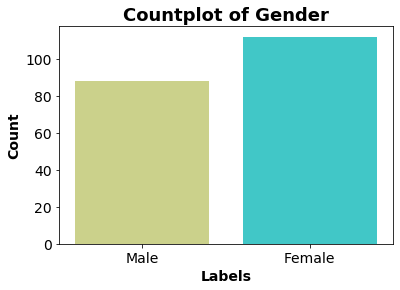

Gender count:
Female    112
Male       88
Name: Gender, dtype: int64

Gender distribution percentage:
Female    56.0
Male      44.0
Name: Gender, dtype: float64


In [5]:
#counting gender values 
sns.countplot(data=data, x='Gender', palette='rainbow_r')
plt.title("Countplot of Gender", fontsize=18, weight='heavy')
plt.ylabel("Count", fontsize=14, weight='heavy')
plt.xlabel("Labels", fontsize=14, weight='heavy')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

# getting value count: 
count=data['Gender'].value_counts()
print(f'Gender count:\n{count}')
print()

#getting percentage  
percentage=data['Gender'].value_counts()/len(data)*100.0
print(f'Gender distribution percentage:\n{percentage}')

**There are more female customers than male customers.**

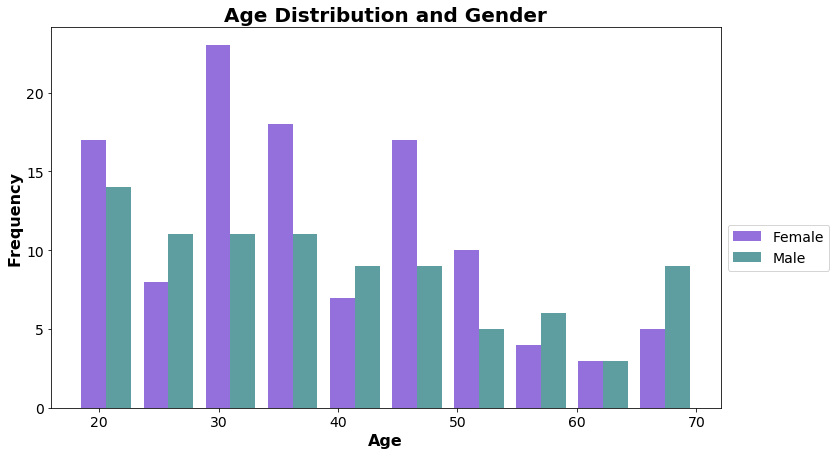

In [6]:
#visual aid for gender distribution with respect to age 
female_gender=data[data["Gender"]=="Female"]
male_gender=data[data['Gender']=="Male"]


plt.figure(figsize=(12,7))

female_age=female_gender["Age"]
male_age=male_gender["Age"]

plt.hist([female_age, male_age], label=["Female", "Male"], color=["mediumpurple", "cadetblue"])

#location of legend 
plt.gca().legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=14)


#creating title 
plt.title('Age Distribution and Gender', 
          weight='bold', fontsize=20)


#formatting x and y labels 
plt.xlabel('Age', weight='bold', fontsize=16)
plt.ylabel('Frequency', weight='bold', fontsize=16)


# format the x and y ticks
plt.xticks(rotation=0, horizontalalignment='center', 
           weight='normal', fontsize=14)

plt.yticks(weight='normal', fontsize=14)


plt.show()



**There are more male customers age 70 than female customers, and more female customers younger than 35 years old compared to male customers.**

Female max age value: 68
Female min age value: 18

Male max age value: 70
Male min age value: 18


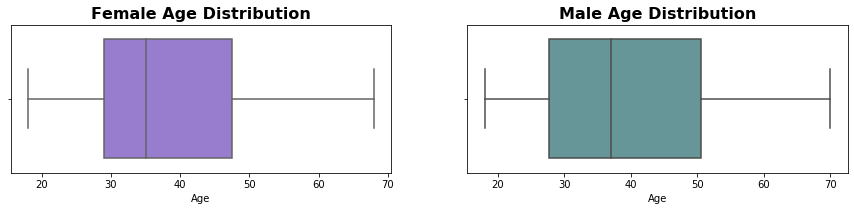

In [7]:
#checking for max age and min age of each gender group:
#female
female_max= female_gender["Age"]
female_max_age = female_max.max() 
print(f'Female max age value: {female_max_age}')

female_min= female_gender["Age"]
female_min_age = female_min.min() 
print(f'Female min age value: {female_min_age}\n')

#making visual aid for female gender
plt.figure(figsize=(15,6))
plt.subplot(2,2,1)
sns.boxplot(female_gender.Age,color='mediumpurple')
plt.title('Female Age Distribution',fontsize=16, weight='heavy')
########################################################################

#male 
male_max= male_gender["Age"]
male_max_age = male_max.max() 
print(f'Male max age value: {male_max_age}')

male_min= male_gender["Age"]
male_min_age = male_min.min() 
print(f'Male min age value: {male_min_age}')

plt.subplot(2,2,2)
sns.boxplot(male_gender.Age,color='cadetblue')
plt.title('Male Age Distribution',fontsize=16, weight='heavy')
plt.show()

**The min value for both gender is 18, while max age value for female customers is 68 and male customers 70 so mean age for male gender is higher than age for female gender.**

In [8]:
#descriptive statistical values 
data.describe()

,Age,Annual Income (k$),Spending Score (1-100)
count,200.000000,200.000000,200.000000
mean,38.850000,60.560000,50.200000
std,13.969007,26.264721,25.823522
min,18.000000,15.000000,1.000000
25%,28.750000,41.500000,34.750000
50%,36.000000,61.500000,50.000000
75%,49.000000,78.000000,73.000000
max,70.000000,137.000000,99.000000


In [9]:
#descriptive statistical values for female customers
female_gender.describe()

,Age,Annual Income (k$),Spending Score (1-100)
count,112.000000,112.000000,112.000000
mean,38.098214,59.250000,51.526786
std,12.644095,26.011952,24.114950
min,18.000000,16.000000,5.000000
25%,29.000000,39.750000,35.000000
50%,35.000000,60.000000,50.000000
75%,47.500000,77.250000,73.000000
max,68.000000,126.000000,99.000000


In [10]:
#descriptive statistical values for male customers
male_gender.describe()

,Age,Annual Income (k$),Spending Score (1-100)
count,88.000000,88.000000,88.000000
mean,39.806818,62.227273,48.511364
std,15.514812,26.638373,27.896770
min,18.000000,15.000000,1.000000
25%,27.750000,45.500000,24.500000
50%,37.000000,62.500000,50.000000
75%,50.500000,78.000000,70.000000
max,70.000000,137.000000,97.000000


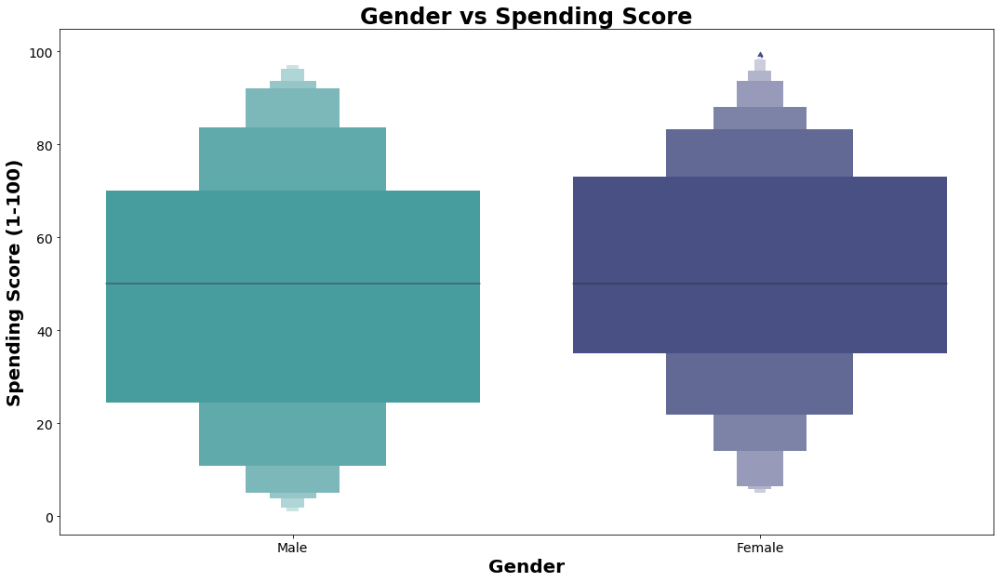

In [11]:
#Gender vs Spendscore
plt.rcParams['figure.figsize'] = (18, 10)
sns.boxenplot(data['Gender'], data['Spending Score (1-100)'], palette = 'mako_r')
plt.title('Gender vs Spending Score', fontsize = 24, weight='heavy')
plt.ylabel('Spending Score (1-100)', fontsize = 20, weight='heavy')
plt.xlabel('Gender', fontsize = 20, weight='heavy')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Female customers on average have a higher spending score than male customers.**

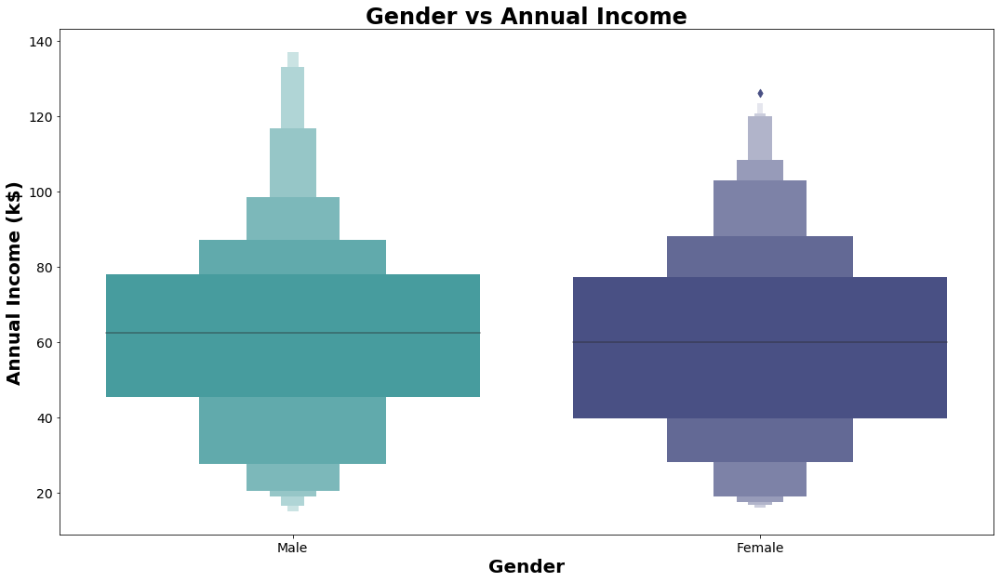

In [12]:
#  Gender vs Annual Income
plt.rcParams['figure.figsize'] = (18, 10)
sns.boxenplot(data['Gender'], data['Annual Income (k$)'], palette = 'mako_r')
plt.title('Gender vs Annual Income', fontsize = 24, weight='heavy')
plt.ylabel('Annual Income (k$)', fontsize = 20, weight='heavy')
plt.xlabel('Gender', fontsize = 20, weight='heavy')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Male customers on average have a higher annual income than female customers.**

**Gender Comparison**
* The max annual income for female customers is 126K and max annual income for male customers is 137K. 
* The max spending score of female customers is 99 while male customers is 97. 
* Overall, in each of the age brackets, the female customers have a lower annual income than male customers and the female customers have a higher spending score than male customers. This means that even though male customers have a higher annual income, they have less of a spending score compared to the female customers that have a lower mean annual income and have greater spending score. (Female customers have higher spending activities than male customers) 
* The mean age of female customer is 38 and male customers 39. 

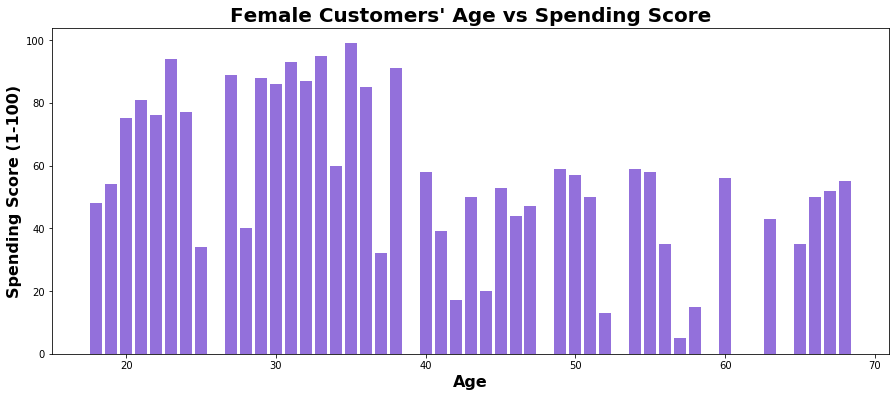

In [13]:
female_gender.sort_values(['Age'])
plt.figure(figsize=(15,6))
plt.bar(female_gender['Age'],female_gender['Spending Score (1-100)'],color='mediumpurple')
plt.title("Female Customers' Age vs Spending Score", weight='heavy', fontsize=20)
plt.xlabel('Age', weight='heavy', fontsize=16)
plt.ylabel('Spending Score (1-100)', weight='heavy', fontsize=16)
plt.show()

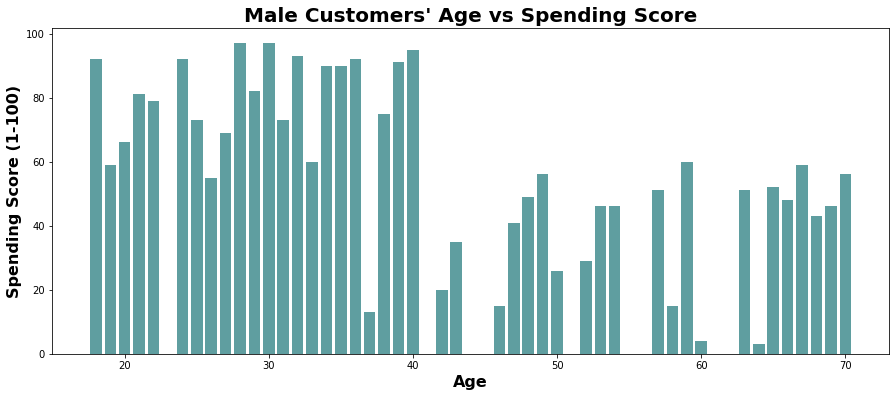

In [14]:
male_gender.sort_values(['Age'])
plt.figure(figsize=(15,6))
plt.bar(male_gender['Age'],male_gender['Spending Score (1-100)'],color='cadetblue')
plt.title("Male Customers' Age vs Spending Score", weight='heavy', fontsize=20)
plt.xlabel('Age', weight='heavy', fontsize=16)
plt.ylabel('Spending Score (1-100)', weight='heavy', fontsize=16)
plt.show()

**Age vs. Spending Score:**
* Spending Score for both gender is generally at the highest for age groups 18-40 years old and lowest spending score for both gender is generally at the lowest after 40 years of age.

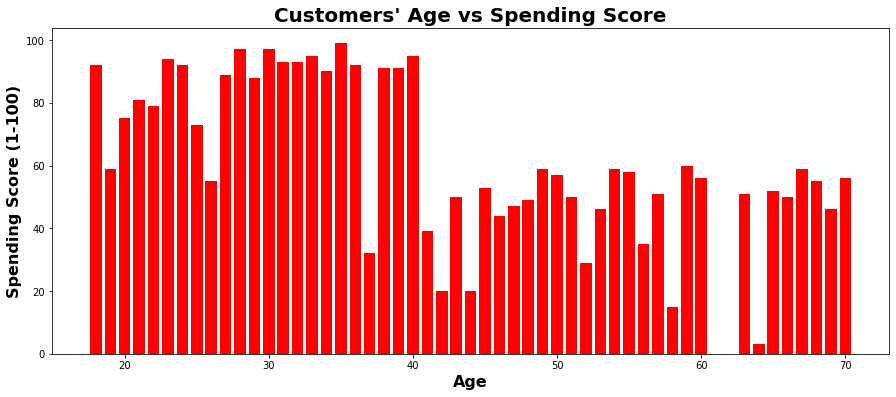

In [15]:
data.sort_values(['Age'])
plt.figure(figsize=(15,6))
plt.bar(data['Age'],data['Spending Score (1-100)'],color='red')
plt.title("Customers' Age vs Spending Score", weight='heavy', fontsize=20)
plt.xlabel('Age', weight='heavy', fontsize=16)
plt.ylabel('Spending Score (1-100)', weight='heavy', fontsize=16)
plt.show()

In [16]:
#getting rid of object datatypes
data=data.drop(["Gender"], axis=1)
data_shape=data.shape
print(f'Data shape after dropping object datatype "Gender" is {data_shape}')

Data shape after dropping object datatype "Gender" is (200, 3)


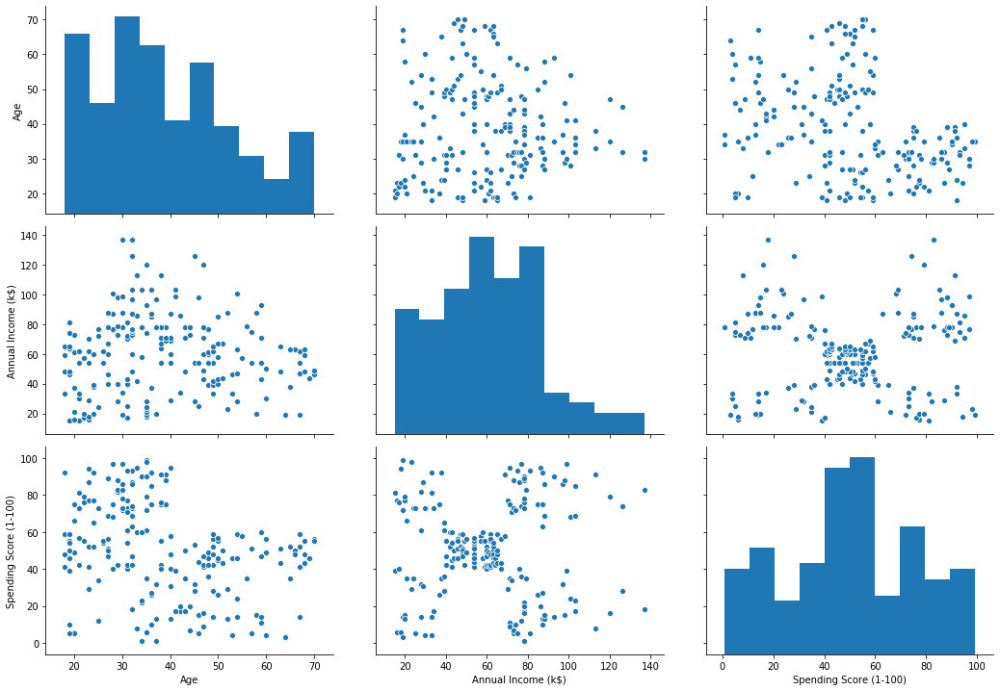

In [17]:
g=sns.pairplot(data)
g.fig.set_size_inches(15,10)

* Ages 30+ have annual income of 80K+
* Spending Score and Annual Income pairplot have 5 distinct clusters
* The spending score of 60+ belong to age groups less than 50, which means that younger aged customers are spending more than older aged customers. 

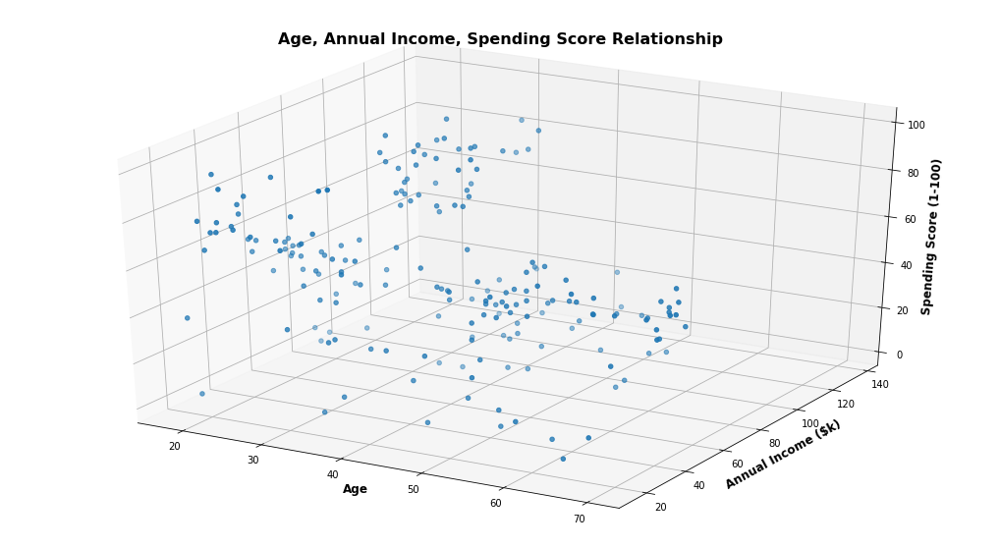

In [18]:
#Making 3d plot to display all features 
from mpl_toolkits.mplot3d import Axes3D

three_d= plt.figure().gca(projection='3d')
three_d.scatter(data.Age, data['Annual Income (k$)'], data['Spending Score (1-100)'])
three_d.set_xlabel('Age', weight='heavy', fontsize=12)
three_d.set_ylabel("Annual Income ($k)", weight='heavy', fontsize=12)
three_d.set_zlabel('Spending Score (1-100)', weight='heavy', fontsize=12)
three_d.set_title("Age, Annual Income, Spending Score Relationship", weight='heavy', fontsize=16)
plt.show()

In [19]:
#Scaling the data using StandardScaler() since the variables are measured in different scales

# Standarizing the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

#making dataframe for standarized features 
scaled_data= pd.DataFrame(scaled_data, columns=data.columns)
#checking shape of data after getting rid of object datatypes
shape=scaled_data.shape
print(f'With using only the numerical features, the standarized data shape is {shape}')
scaled_data.head()

With using only the numerical features, the standarized data shape is (200, 3)


,Age,Annual Income (k$),Spending Score (1-100)
0,-1.424569,-1.738999,-0.434801
1,-1.281035,-1.738999,1.195704
2,-1.352802,-1.700830,-1.715913
3,-1.137502,-1.700830,1.040418
4,-0.563369,-1.662660,-0.395980


In [20]:
#changing column names 
scaled_data = scaled_data.rename(columns={"Age:":"age", 'Annual Income (k$)': 'annual_income', 'Spending Score (1-100)':"spending_score"})
scaled_data.head()

,Age,annual_income,spending_score
0,-1.424569,-1.738999,-0.434801
1,-1.281035,-1.738999,1.195704
2,-1.352802,-1.700830,-1.715913
3,-1.137502,-1.700830,1.040418
4,-0.563369,-1.662660,-0.395980


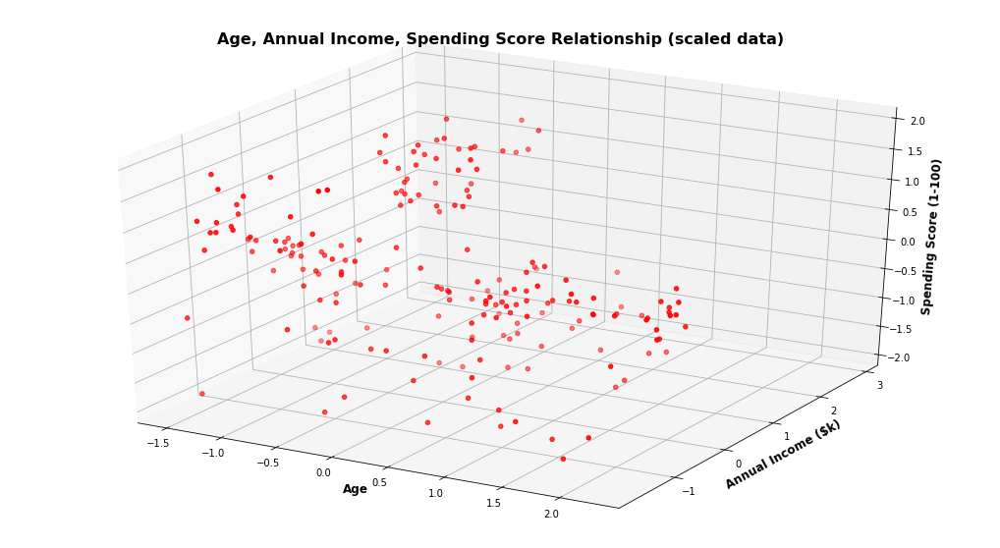

In [21]:
#Making 3d plot to display all features 
from mpl_toolkits.mplot3d import Axes3D

three_d= plt.figure().gca(projection='3d')
three_d.scatter(scaled_data.Age, scaled_data['annual_income'], scaled_data['spending_score'], color='red')
three_d.set_xlabel('Age', weight='heavy', fontsize=12)
three_d.set_ylabel("Annual Income ($k)", weight='heavy', fontsize=12)
three_d.set_zlabel('Spending Score (1-100)', weight='heavy', fontsize=12)
three_d.set_title("Age, Annual Income, Spending Score Relationship (scaled data)", weight='heavy', fontsize=16)
plt.show()

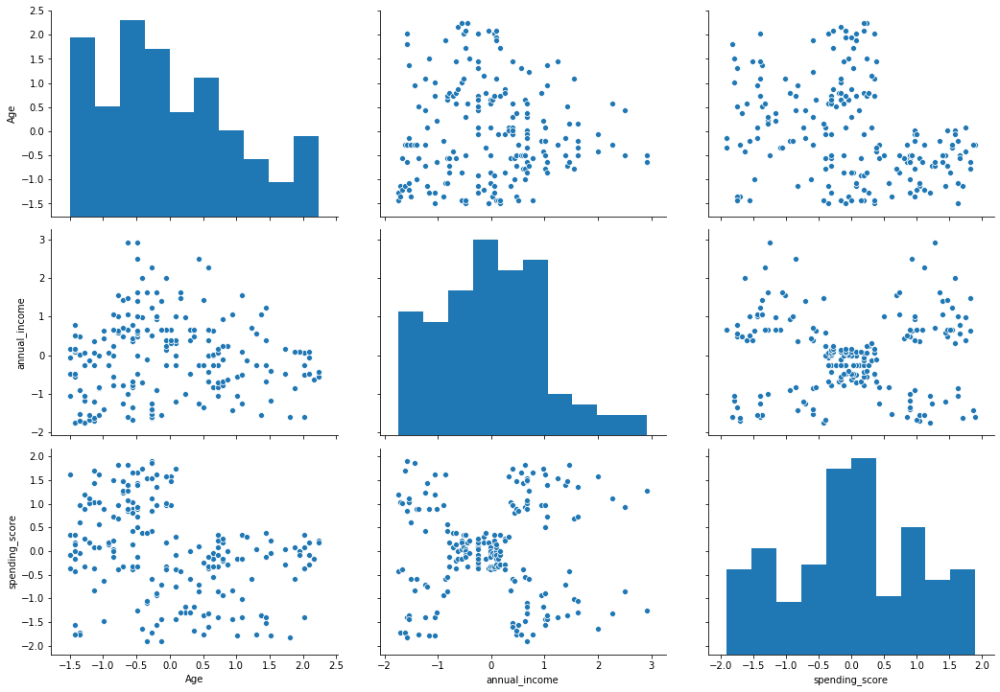

In [22]:
g=sns.pairplot(scaled_data)
g.fig.set_size_inches(15,10)

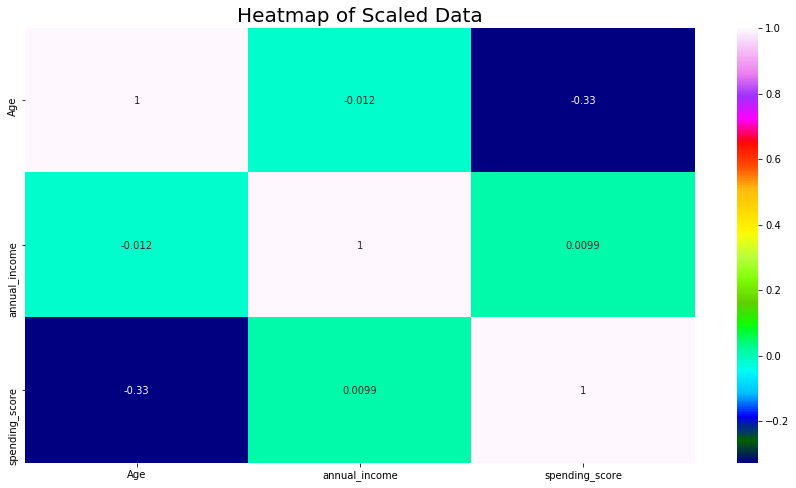

In [23]:
plt.rcParams['figure.figsize'] = (15, 8)
sns.heatmap(scaled_data.corr(), cmap = 'gist_ncar', annot = True)
plt.title('Heatmap of Scaled Data', fontsize = 20)
plt.show()

<h1><font color="red">K-means</font></h1>

### Finding ideal number of clusters for the data
* KMeans "elbow method" and silhouette score.
* Silhouette score ranges from -1 to 1. A high silhouette score suggests that the objects are well matched to their own cluster and a low silhouette score means the objects are poorly matched to their own cluster. 


* Number of clusters has no relationship with number of features
* Number of features should not exceed number of principal components for PCA because defeats purpose of dimensionality reduction.
* Ideal explained variance ratio is from 80-95%

In [24]:
range_n_clusters=range(2,11)
mean_sil=[]

for n_clusters in range_n_clusters:
    clusterer=KMeans(n_clusters=n_clusters, random_state=24)
    cluster_labels=clusterer.fit_predict(scaled_data)

    sample_silhouette_values=silhouette_score(scaled_data, cluster_labels, random_state=24)
    mean_silhouette_score=np.mean(sample_silhouette_values)
    
    mean_sil.append(mean_silhouette_score)
    
    print(f"The mean silhouette score for n_clusters={n_clusters} is {mean_silhouette_score}")
print(f'\nThe highest silhouette score is', np.max(mean_sil))

The mean silhouette score for n_clusters=2 is 0.33547192894004574
The mean silhouette score for n_clusters=3 is 0.357793388710272
The mean silhouette score for n_clusters=4 is 0.4039582785148566
The mean silhouette score for n_clusters=5 is 0.41664341513732767
The mean silhouette score for n_clusters=6 is 0.42742814991580175
The mean silhouette score for n_clusters=7 is 0.41749371992606155
The mean silhouette score for n_clusters=8 is 0.40926049040446044
The mean silhouette score for n_clusters=9 is 0.4075381319176147
The mean silhouette score for n_clusters=10 is 0.40307645749752935

The highest silhouette score is 0.42742814991580175


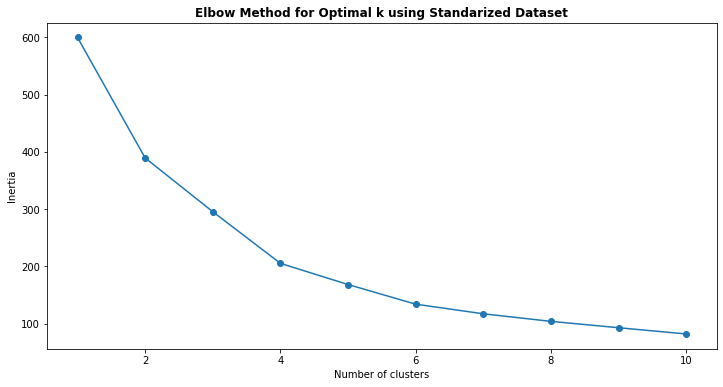

In [25]:
#utilizing the Elbow Method to determine the optimal number of clusters KMeans should obtain
sse = []
k_list = range(1, 11)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(scaled_data)
    sse.append([k, km.inertia_])
    
oca_results_scale = pd.DataFrame({'Cluster': range(1,11), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title("Elbow Method for Optimal k using Standarized Dataset", weight='heavy')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

**Based on the Elbow Method, the ideal number of cluster is 2 or 4 because these are the locations of the curve. Their silhouette scores are 0.335 and 0.404, respectively. Note, the highest silhouette score is n_clusters=6, however, this is not the location of the sharpness of elbow curve. Trying out clusters 2 to 6.**

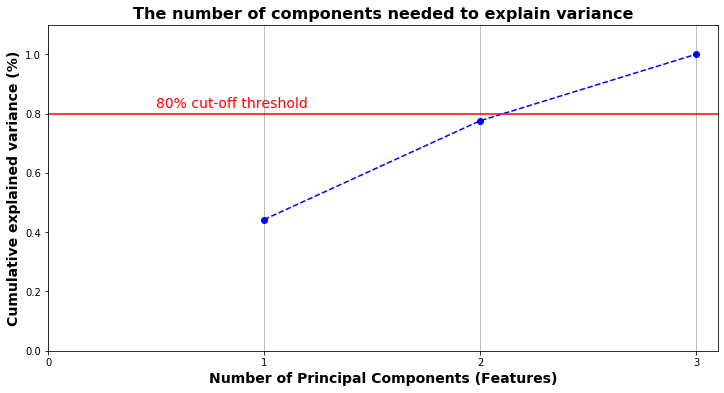

In [26]:
#determining the ideal number principal component to use 
#number of principal components is the number of ideal features
pca = PCA().fit(scaled_data)

%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 4, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Principal Components (Features)', weight='heavy', fontsize=14)
plt.xticks(np.arange(0, 4, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative explained variance (%)', weight='heavy', fontsize=14)
plt.title('The number of components needed to explain variance', weight='heavy', fontsize=16)

plt.axhline(y=0.80, color='r', linestyle='-')
plt.text(0.5, 0.82, '80% cut-off threshold', color = 'red', fontsize=14)

ax.grid(axis='x')
plt.show()

**At principal component (PC) 1, it seems that less than 50% are accounted or are explained variance so this is not the ideal PC because we lose 50% of dataset variance. The ideal number of PC is 2 at roughly 80% accounted variance and not PC=3 because it could lead to overfitting.**

In [27]:
#checking for the sum of explained variance ratio of principal component=2
pca2 = PCA(n_components=2, svd_solver='full')
pca2 = pca2.fit(scaled_data)
print(f"PCA n_components=2 Explained Variance Ratio:\n{pca2.explained_variance_ratio_}")

pca_sum=np.sum(pca2.explained_variance_ratio_).round(3)
print(f"\nExplained Variance Ratio Sum: {pca_sum}")

pca2=pca2.fit_transform(scaled_data)
pca2_df = pd.DataFrame(pca2, columns=['pc1','pc2'])
print(f"Shape of Dataset:", pca2_df.shape)

PCA n_components=2 Explained Variance Ratio:
[0.44266167 0.33308378]

Explained Variance Ratio Sum: 0.776
Shape of Dataset: (200, 2)


In [28]:
pca3 = PCA(n_components=3, svd_solver='full')
pca3 = pca3.fit(scaled_data)
print(f"PCA n_components=3 Explained Variance Ratio:\n{pca3.explained_variance_ratio_}")

pca_sum=np.sum(pca3.explained_variance_ratio_).round(3)
print(f"\nExplained Variance Ratio Sum: {pca_sum}")

pca3=pca3.fit_transform(scaled_data)
pca3_df = pd.DataFrame(pca3, columns=['pc1','pc2', 'pc3'])
print(f"Shape of Dataset:", pca3_df.shape)

PCA n_components=3 Explained Variance Ratio:
[0.44266167 0.33308378 0.22425454]

Explained Variance Ratio Sum: 1.0
Shape of Dataset: (200, 3)


**The explained variance ratio with 3 principal components has a sum of 1, which could lead to overfitting if used and since we know that our dataset has 3 features, using PC=3 does not make sense since it defeats the purpose of dimensionality reduction, which is what PCA is supposed to do. The 2 principal components, is ideal because it is roughly 80%, which is ideal for exlained variance ratio.**

In [29]:
#checking silhouette scores for dataset with 2 principal components 

range_n_clusters=range(2,11)
mean_sil=[]

for n_clusters in range_n_clusters:
    clusterer=KMeans(n_clusters=n_clusters, random_state=24)
    cluster_labels=clusterer.fit_predict(pca2_df)

    sample_silhouette_values=silhouette_score(pca2_df, cluster_labels, metric="euclidean", random_state=24)
    mean_silhouette_score=np.mean(sample_silhouette_values)
    
    mean_sil.append(mean_silhouette_score)

    print(f"The mean silhouette score for n_clusters={n_clusters} is {mean_silhouette_score}")
print(f'\nThe highest silhouette score is', np.max(mean_sil))

The mean silhouette score for n_clusters=2 is 0.42563331458151
The mean silhouette score for n_clusters=3 is 0.4136238273291638
The mean silhouette score for n_clusters=4 is 0.42092860310837976
The mean silhouette score for n_clusters=5 is 0.38981142807850383
The mean silhouette score for n_clusters=6 is 0.3635392693856005
The mean silhouette score for n_clusters=7 is 0.3864157675390145
The mean silhouette score for n_clusters=8 is 0.3889788055266483
The mean silhouette score for n_clusters=9 is 0.39553386506798416
The mean silhouette score for n_clusters=10 is 0.3985576294610247

The highest silhouette score is 0.42563331458151


**The highest silhouette score using a 2 principal component dataset is from 4 clusters. Will be using clusters 2 through 4 for visual comparison because they have the highest silhouette scores.**

In [30]:
#displaying the 2 principal component dataset
pca2_df.head()

,pc1,pc2
0,-0.615720,-1.763481
1,-1.665793,-1.820747
2,0.337862,-1.674799
3,-1.456573,-1.772430
4,-0.038465,-1.662740


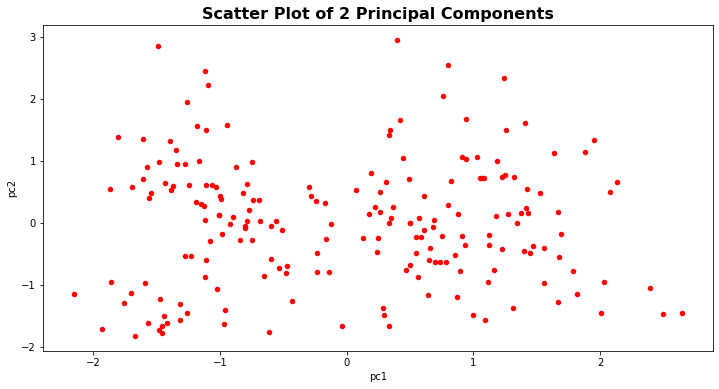

In [31]:
#Since working on the 2 principal component dataset, making scatter plot for PC2 to see how samples are distributed. 
pca2_df.plot(kind="scatter", x="pc1", y="pc2", color='red')
plt.title("Scatter Plot of 2 Principal Components", weight='heavy', fontsize=16)
plt.show()

**Distinct clusters are not obvious.**

In [32]:
#making empty list for storing silhouette scores, which will be used for visual aid 
list_silhouettescores=[]
list_n_clusters=[]

In [33]:
#applying kmeans clustering algorithm for 2 clusters
km=KMeans(n_clusters=2, random_state=24) 

#fitting model to pca2_df
km=km.fit(pca2_df)

#getting predicted clusters
y_predicted=km.fit_predict(pca2_df)
print(f"Shape of Dataset:", pca2_df.shape)


#evaluation metric: silhouette_score
silhouette_kmeans2=metrics.silhouette_score(pca2_df, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=2 using PCA=2: {silhouette_kmeans2}")

#appending silhouette score and number of cluster to list
list_silhouettescores.append(silhouette_kmeans2)
list_n_clusters.append("2")

#adding labels to the ds
#pca2_df['clusters_2_pred']=km.labels_

Shape of Dataset: (200, 2)
Silhouette score for KMeans n_clusters=2 using PCA=2: 0.42563331458151


Silhouette score for KMeans n_clusters=2 using PCA=2: 0.42563331458151


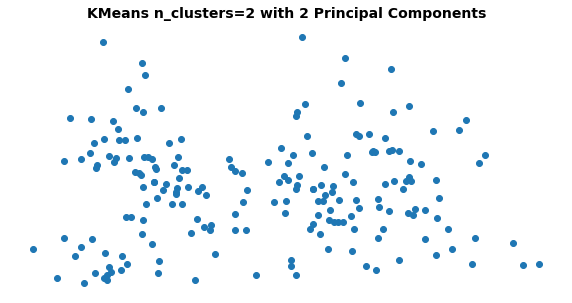

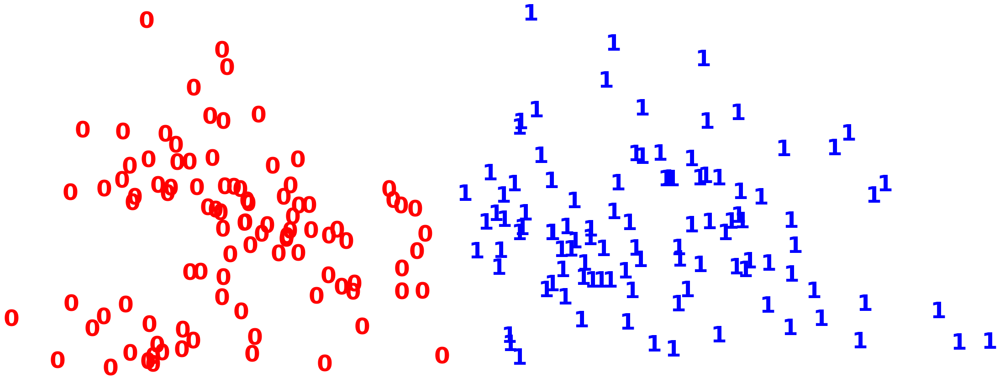

In [34]:
print(f"Silhouette score for KMeans n_clusters=2 using PCA=2: {silhouette_kmeans2}")

#using pc=2 on kmeans with 2 clusters for visual
#graphing with no color cues
plt.figure(figsize=(10,5))
plt.scatter(pca2[:, 0], pca2[:, 1])
plt.xticks([])
plt.yticks([])
plt.title("KMeans n_clusters=2 with 2 Principal Components", weight='heavy', fontsize=14)
plt.axis('off')


#graphing with color cues
plt.figure(figsize=(8,3))
colours = "rbg"
for i in range(pca2.shape[0]):
    plt.text(pca2[i, 0], pca2[i, 1], str(y_predicted[i]),
             color=colours[y_predicted[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**KMeans n_clusters=2 does a good job of showing distinct clusters. There are no overlapping samples and each cluster is divided well in both sides.**

In [35]:
#applying kmeans clustering algorithm for 3 clusters
km=KMeans(n_clusters=3, random_state=24) 

#fitting model to pca2_df
km=km.fit(pca2_df)

#getting predicted clusters
y_predicted=km.fit_predict(pca2_df)
print(f"Shape of Dataset:", pca2_df.shape)


#evaluation metric: silhouette_score
silhouette_kmeans3=metrics.silhouette_score(pca2_df, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=3 using PCA=2: {silhouette_kmeans3}")

#appending silhouette score and number of cluster 
list_silhouettescores.append(silhouette_kmeans3)
list_n_clusters.append("3")

#adding labels to the ds
#pca2_df['clusters_2_pred']=km.labels_

Shape of Dataset: (200, 2)
Silhouette score for KMeans n_clusters=3 using PCA=2: 0.4136238273291638


Silhouette score for KMeans n_clusters=3 using PCA=2: 0.4136238273291638


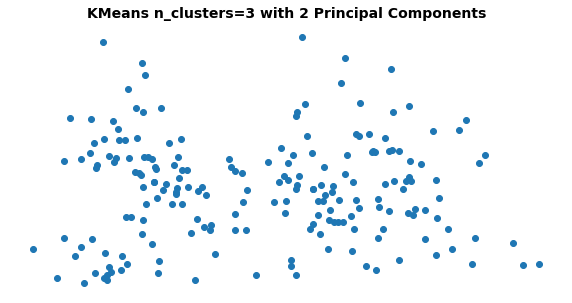

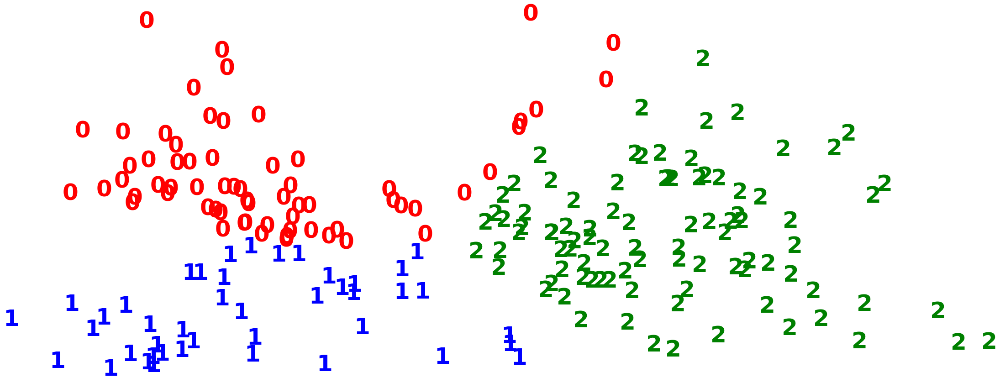

In [36]:
#visual aid for 3 clusters 

print(f"Silhouette score for KMeans n_clusters=3 using PCA=2: {silhouette_kmeans3}")

#using pc=2 on kmeans with 3 clusters for visual
#graphing with no color cues
plt.figure(figsize=(10,5))
plt.scatter(pca2[:, 0], pca2[:, 1])
plt.xticks([])
plt.yticks([])
plt.title("KMeans n_clusters=3 with 2 Principal Components", weight='heavy', fontsize=14)
plt.axis('off')


#graphing with color cues
plt.figure(figsize=(8,3))
colours = "rbg"
for i in range(pca2.shape[0]):
    plt.text(pca2[i, 0], pca2[i, 1], str(y_predicted[i]),
             color=colours[y_predicted[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**KMeans n_clusters=3 does an okay job of separating clusters. There are several samples distant from their main cluster group shown at the top, which is not ideal representation.**

In [37]:
#applying kmeans clustering algorithm for 4 clusters
km=KMeans(n_clusters=4, random_state=24) 

#fitting model to pca2_df
km=km.fit(pca2_df)

#getting predicted clusters
y_predicted=km.fit_predict(pca2_df)
print(f"Shape of Dataset:", pca2_df.shape)


#evaluation metric: silhouette_score
silhouette_kmeans4=metrics.silhouette_score(pca2_df, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=4 using PCA=2: {silhouette_kmeans4}")

#appending silhouette score and number of cluster 
list_silhouettescores.append(silhouette_kmeans4)
list_n_clusters.append("4")

Shape of Dataset: (200, 2)
Silhouette score for KMeans n_clusters=4 using PCA=2: 0.42092860310837976


Silhouette score for KMeans n_clusters=4 using PCA=2: 0.42092860310837976


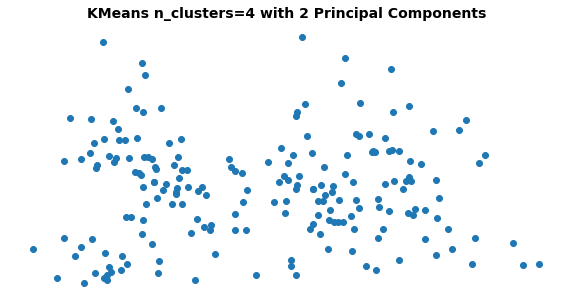

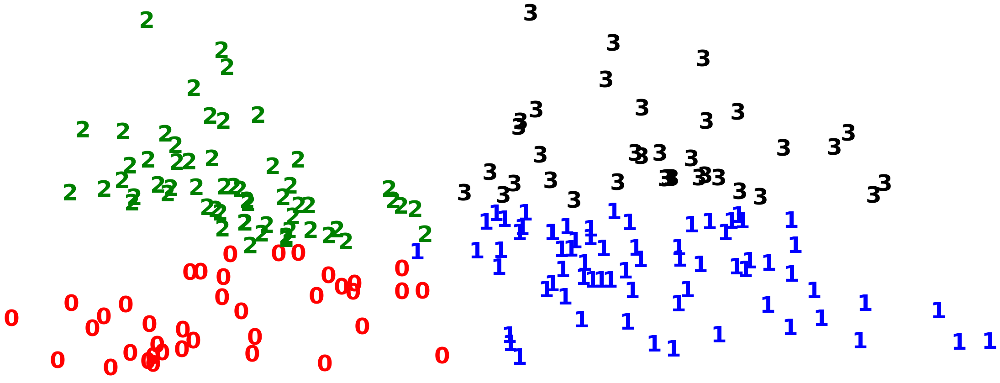

In [38]:
#visual aid for 4 clusters 

print(f"Silhouette score for KMeans n_clusters=4 using PCA=2: {silhouette_kmeans4}")

plt.figure(figsize=(10,5))
plt.scatter(pca2[:, 0], pca2[:, 1])
plt.xticks([])
plt.yticks([])
plt.title("KMeans n_clusters=4 with 2 Principal Components", weight='heavy', fontsize=14)
plt.axis('off')


#graphing with color cues
plt.figure(figsize=(8,3))
colours = ["red", "blue", "green", 'black']
for i in range(pca2.shape[0]):
    plt.text(pca2[i, 0], pca2[i, 1], str(y_predicted[i]),
             color=colours[y_predicted[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**KMeans n_clusters=4 does a better job showing distinct clusters compared to using 3 clusters. There are a couple of overlapping samples towards the middle region.**

In [39]:
#for eligibility, rounding silhouette scores to 3 decimal places
sil_rounded = [round(x,3) for x in list_silhouettescores] 
sil_rounded

[0.426, 0.414, 0.421]

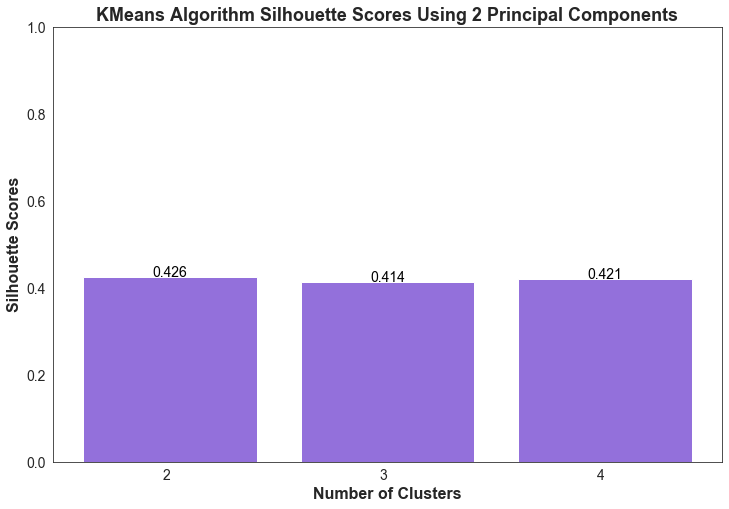

In [40]:
#using bar graph to display the silhouette scores for the number of clusters used in KMeans algorithm


plt.figure(figsize=(12,8))
sns.set_style("white")

no_clusters=list_n_clusters
sil_scores=sil_rounded

plt.bar(no_clusters,sil_scores, color='mediumpurple')

#labeling each bar with their cv score value. 
for i in range(len(sil_scores)):
    plt.annotate(str(sil_scores[i]), xy=(no_clusters[i],sil_scores[i]), ha='center', 
                 fontsize=14,fontweight='normal', color='black') #va='bottom')
    

    

plt.title("KMeans Algorithm Silhouette Scores Using 2 Principal Components", fontsize=18,weight='heavy')
plt.xlabel('Number of Clusters', fontsize=16, weight='heavy')
plt.ylabel('Silhouette Scores', fontsize=16, weight='heavy')

plt.xticks(rotation=0, horizontalalignment='right', 
           weight='normal', fontsize=14)
plt.yticks(weight='normal', fontsize=14)

plt.ylim(top=1) #setting y-axis limit value 


plt.show()

**Silhouette Scores and PCA visual analysis:**
* 2 clusters has the highest silhouette score and most distinct clusters. 
* 3 clusters has the worst clustering performance based on visual aid. 
* 4 clusters performs better than 3 clusters. 

**The best overall performance is 2 clusters followed by 4 clusters.**

In [41]:
#applying kmeans clustering algorithm for 2 clusters
km=KMeans(n_clusters=2, random_state=24) 

#fitting model to pca2_df
km=km.fit(pca2_df)

#getting predicted clusters
y_predicted=km.fit_predict(pca2_df)
print(f"Shape of Dataset:", pca2_df.shape)


#evaluation metric: silhouette_score
silhouette_kmeans2=metrics.silhouette_score(pca2_df, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=2 using PCA=2: {silhouette_kmeans2}")

Shape of Dataset: (200, 2)
Silhouette score for KMeans n_clusters=2 using PCA=2: 0.42563331458151


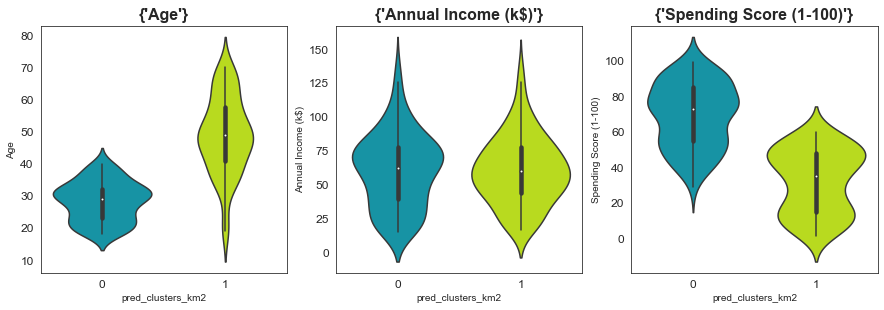

In [42]:
#making violinplots

#adding predictive labels from kmeans ncluster=2 to the non-scaled_data
data['pred_clusters_km2']=km.labels_

i=1
plt.figure(figsize=(15,10))
for col in data.columns[:3]:
    plt.subplot(2,3,i)
    plt.title({col}, fontsize=16, weight='heavy')
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    sns.violinplot(y=data[col], x=data['pred_clusters_km2'], palette='nipy_spectral')
    i+=1
    
    
#plt.tight_layout()
plt.show()

In [43]:
#scatter matrix 
import plotly.express as px
fig = px.scatter_matrix(data, 
                        dimensions=data.columns[:-1], color='pred_clusters_km2', title='Scatter Matrix of Features Using 2 Clusters', height=800)

fig

### Cluster 1 v Cluster 0

**Spending score v Age**
* Cluster 1 (yellow) advanced aged customers show lower spending score than cluster 0(blue).
* Cluster 0 (blue) younger aged customer have a higher spending score than cluster 1(yellow).

**Annual Income v Age**
* Cluster 1 represent older aged group and their annual Income is higher than younger aged group represented by cluster 0.

**Annual Income v Spending Score**
* Cluster 1 has low spending score across all income 
* Cluster 0 has high spending score across all income 


**Cluster 1 is older aged group and they have lower spending score and higher income compared to cluster 0 which are the younger aged group who has a higher spending score and lower income. 

In [44]:
#applying kmeans clustering algorithm for 4 clusters
km=KMeans(n_clusters=4, random_state=24) 

#fitting model to pca2_df
km4=km.fit(pca2_df)

#getting predicted clusters
y_predicted=km.fit_predict(pca2_df)
print(f"Shape of Dataset:", pca2_df.shape)


#evaluation metric: silhouette_score
silhouette_kmeans2=metrics.silhouette_score(pca2_df, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=2 using PCA=2: {silhouette_kmeans2}")

Shape of Dataset: (200, 2)
Silhouette score for KMeans n_clusters=2 using PCA=2: 0.42092860310837976


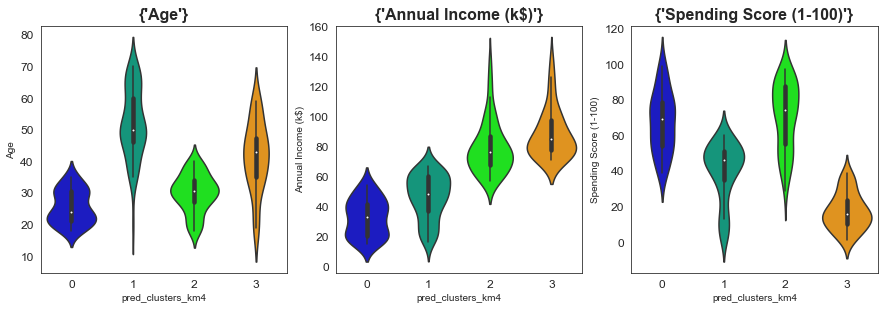

In [45]:
#making violinplots

#adding predictive labels from kmeans ncluster=4 to the non-scaled_data
data['pred_clusters_km4']=km4.labels_

i=1
plt.figure(figsize=(15,10))
for col in data.columns[:3]:
    plt.subplot(2,3,i)
    plt.title({col}, fontsize=16, weight='heavy')
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    sns.violinplot(y=data[col], x=data['pred_clusters_km4'], palette='nipy_spectral')
    i+=1
    
    
#plt.tight_layout()
plt.show()

* Cluster 0 shows the youngest age group, followed by Clusters 2,3 and 1 respectively.
* Annual Income is the lowest for Cluster 0 then 1,2,3
* Spending score is highest for Cluster 2, then 0,1, and 3

In [46]:
#scatter matrix 
import plotly.express as px
fig = px.scatter_matrix(data, 
                        dimensions=data.columns[:-2], color='pred_clusters_km4', title='Scatter Matrix of Features using 4 clusters', height=800)

fig

**Using 4 clusters, the Annual Income v Spending Score graph shows distinct clusters**

In [47]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Age                     200 non-null    int64
 1   Annual Income (k$)      200 non-null    int64
 2   Spending Score (1-100)  200 non-null    int64
 3   pred_clusters_km2       200 non-null    int32
 4   pred_clusters_km4       200 non-null    int32
dtypes: int32(2), int64(3)
memory usage: 6.4 KB


In [48]:
# for interactive visualizations
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
init_notebook_mode(connected = True)
import plotly.figure_factory as ff

In [49]:
trace1 = go.Scatter3d(
    x= data['Age'],
    y= data['Spending Score (1-100)'],
    z= data['Annual Income (k$)'],
    mode='markers',
     marker=dict(
        color = data['pred_clusters_km4'], 
        size= 10,
        line=dict(
            color= data['pred_clusters_km4'],
            width= 12
        ),
        opacity=0.8
     )
)
df = [trace1]

layout = go.Layout(title = 'Kmeans 4 Clusters',
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0  
    ),
    scene = dict(
            xaxis = dict(title  = 'Age'),
            yaxis = dict(title  = 'Spending Score'),
            zaxis = dict(title  = 'Annual Income')
        )
)

fig = go.Figure(data = df, layout=layout)
py.iplot(fig)

## KMeans and UMAP 
[umap](https://umap-learn.readthedocs.io/en/latest/parameters.html) <br>
[umap api guide](https://umap-learn.readthedocs.io/en/latest/api.html)


* Default values for UMAP are (n_neighbors=15, n_components=2, metric='euclidean', metric='euclidean')

In [50]:
#using scaled_data for umap
scaled_data.head()

,Age,annual_income,spending_score
0,-1.424569,-1.738999,-0.434801
1,-1.281035,-1.738999,1.195704
2,-1.352802,-1.700830,-1.715913
3,-1.137502,-1.700830,1.040418
4,-0.563369,-1.662660,-0.395980


In [51]:
fit = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean',min_dist=0.1) #these parameters are default arguements
u = fit.fit_transform(scaled_data)
scaled_data.head()

,Age,annual_income,spending_score
0,-1.424569,-1.738999,-0.434801
1,-1.281035,-1.738999,1.195704
2,-1.352802,-1.700830,-1.715913
3,-1.137502,-1.700830,1.040418
4,-0.563369,-1.662660,-0.395980


In [52]:
#creating empty lists for visual purposes 
silscore_umap=[]
cluster_umap=[]

In [53]:
#default value for n_neighbors is 15
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(scaled_data);
    fig = plt.figure()
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c="springgreen")
    plt.title(title, fontsize=18)

Shape of Dataset: (200, 3)
Silhouette score for KMeans n_clusters=2: 0.33547192894004574


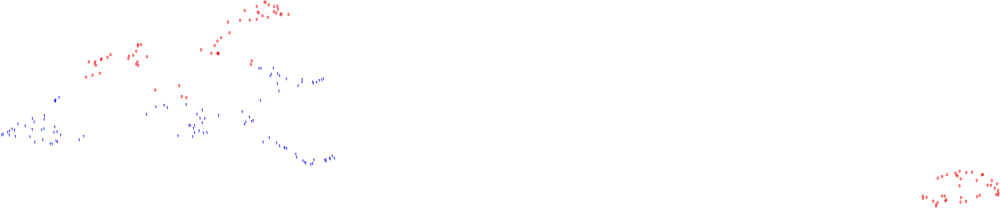

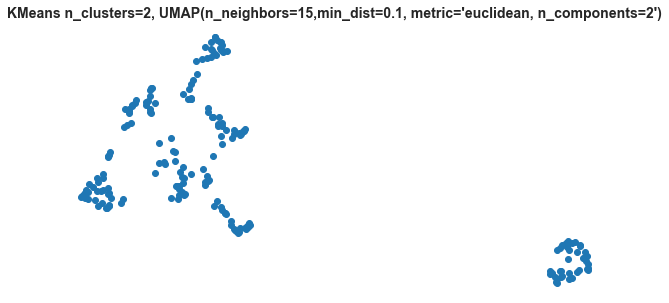

In [54]:
#applying kmeans clustering algorithm for 2 clusters
km=KMeans(n_clusters=2, random_state=24) 

#fitting model to scaled data 
km=km.fit(data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)
print(f"Shape of Dataset:", scaled_data.shape)


#evaluation metric: silhouette_score
sil_score2=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=2: {sil_score2}")

#appending silhouette score and number of cluster 
silscore_umap.append(sil_score2)
cluster_umap.append("2")





###############################################################################################################
#visual aid with color cues 

umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0.1,
                      metric='euclidean',
                        n_components=2).fit_transform(scaled_data)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#visual aid without  color cues 
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=2, UMAP(n_neighbors=15,min_dist=0.1, metric='euclidean, n_components=2')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**Unlike the 2 clusters for PCA, using 2 clusters with UMAP does not do a good job at clustering similar samples together because half of one of the group's samples have their own cluster and is distant when they should be closley aggregated.**

Silhouette score for KMeans n_clusters=3: 0.357793388710272


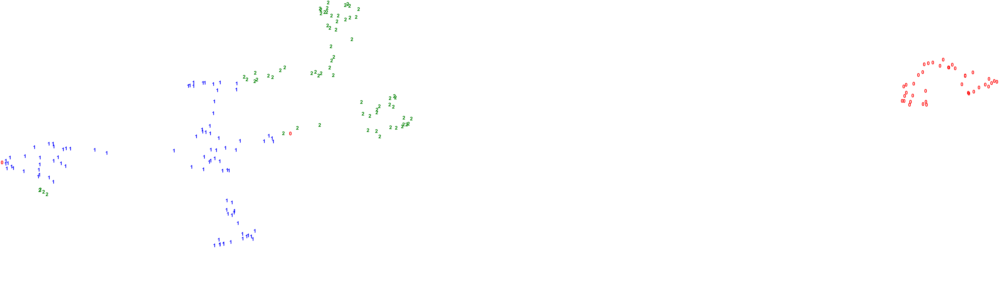

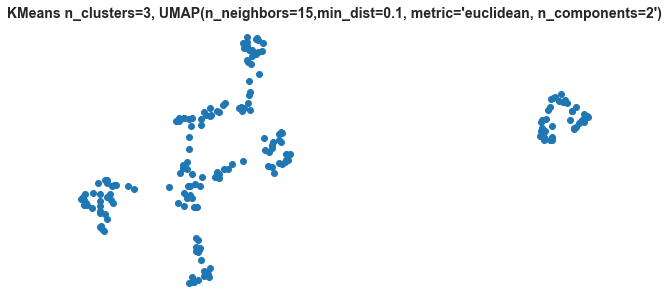

In [55]:
#applying kmeans clustering algorithm for 3 clusters
km=KMeans(n_clusters=3, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)


#evaluation metric: silhouette_score
sil_score3=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=3: {sil_score3}")


#appending silhouette score and number of cluster 
silscore_umap.append(sil_score3)
cluster_umap.append("3")

###############################################################################################################
#visual aid with color cues 

umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0.1,
                      metric='euclidean',
                        n_components=2).fit_transform(scaled_data)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'fontsize':50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#visual aid without color cues 
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=3, UMAP(n_neighbors=15,min_dist=0.1, metric='euclidean, n_components=2')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**Using 3 clusters, the groups are now a bit more distinct from each other. There are however, a couple of mis-clustered samples.**

Silhouette score for KMeans n_clusters=4: 0.4039582785148566


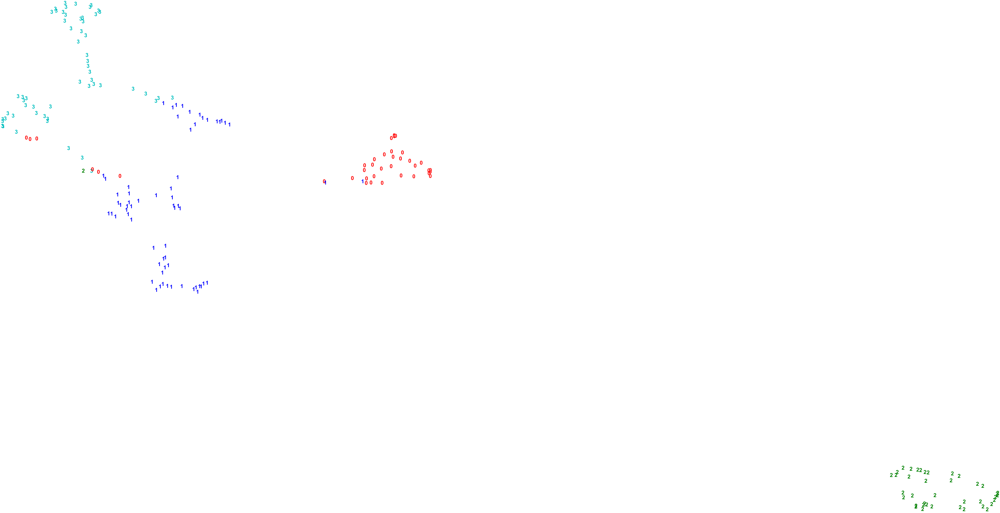

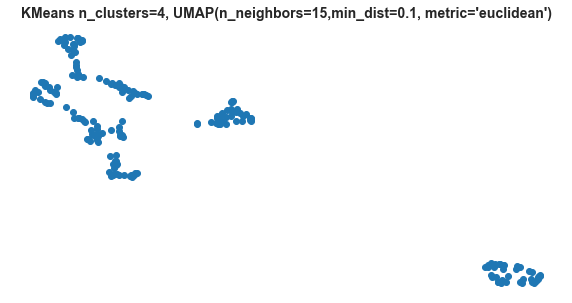

In [56]:
#applying kmeans clustering algorithm for 4 clusters
km=KMeans(n_clusters=4, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)


#evaluation metric: silhouette_score
sil_score4=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=4: {sil_score4}")


#appending silhouette score and number of cluster 
silscore_umap.append(sil_score4)
cluster_umap.append("4")

###############################################################################################################
#visual aid with color cues 
umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0.1,
                      metric='euclidean',
                        n_components=2).fit_transform(scaled_data)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'fontsize':50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


#visual aid without color cues 
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=4, UMAP(n_neighbors=15,min_dist=0.1, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**4 clusters for KMeans is better than 2 or 3 clusters because one group is distinct from the others, while most of the clusters are semi-distinct with each with a couple of sample overlap.**

In [57]:
#for eligibility, rounding silhouette scores to 3 decimal places
sil_rounded_umap = [round(x,3) for x in silscore_umap] 
sil_rounded_umap

[0.335, 0.358, 0.404]

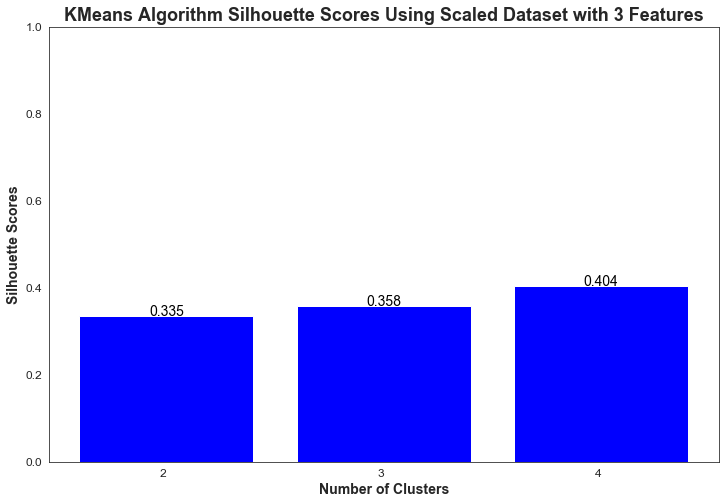

In [58]:
#using bar graph to display the silhouette scores for the number of clusters used in KMeans algorithm


plt.figure(figsize=(12,8))
sns.set_style("white")

no_clusters=cluster_umap
sil_scores=sil_rounded_umap

plt.bar(no_clusters,sil_scores, color='blue')

#labeling each bar with their cv score value. 
for i in range(len(sil_scores)):
    plt.annotate(str(sil_scores[i]), xy=(no_clusters[i],sil_scores[i]), ha='center', 
                 fontsize=14,fontweight='normal', color='black') #va='bottom')
    

    

plt.title("KMeans Algorithm Silhouette Scores Using Scaled Dataset with 3 Features", fontsize=18,weight='heavy')
plt.xlabel('Number of Clusters', fontsize=14, weight='heavy')
plt.ylabel('Silhouette Scores', fontsize=14, weight='heavy')

plt.xticks(rotation=0, horizontalalignment='right', 
           weight='normal', fontsize=12)
plt.yticks(weight='normal', fontsize=12)

plt.ylim(top=1) #setting y-axis limit value 


plt.show()

**Best overall performance is from using 4 clusters so will be applying 4 clusters for UMAP hyperparameter tuning.**

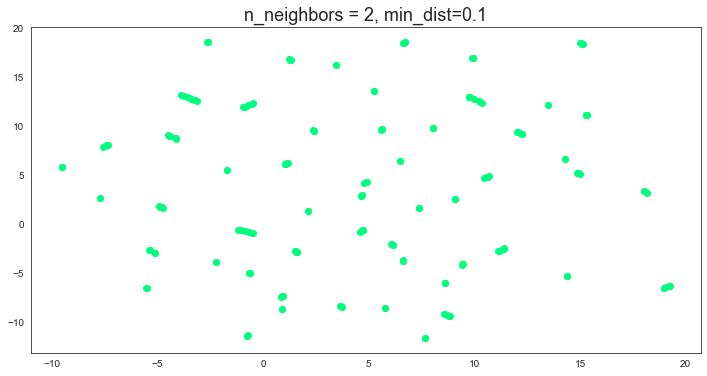

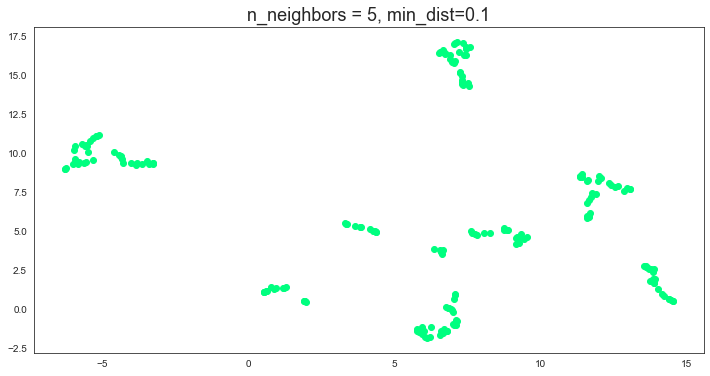

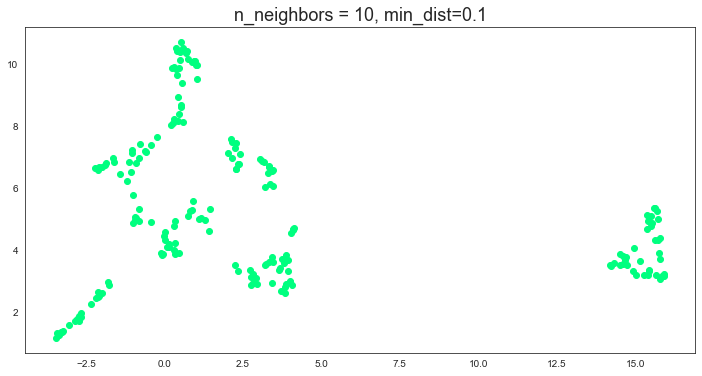

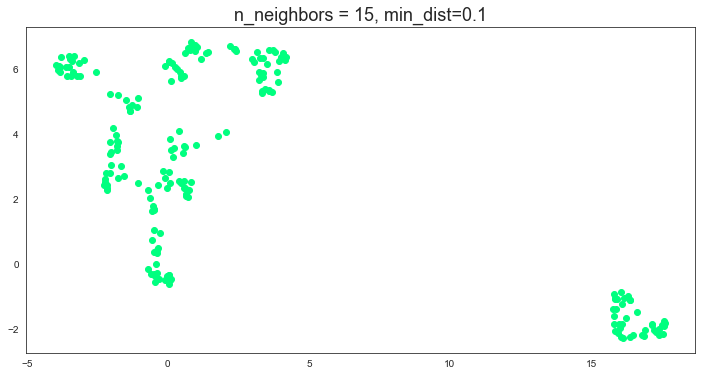

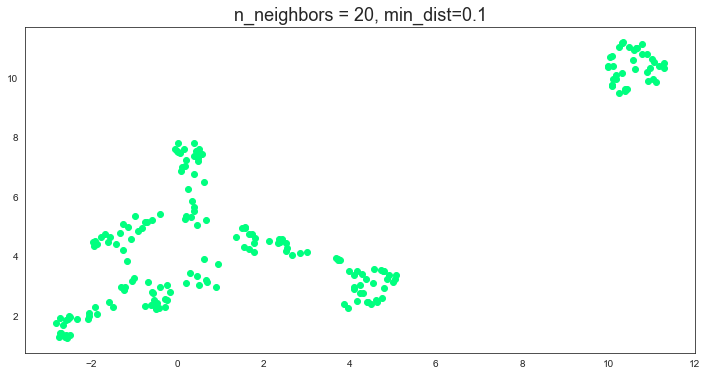

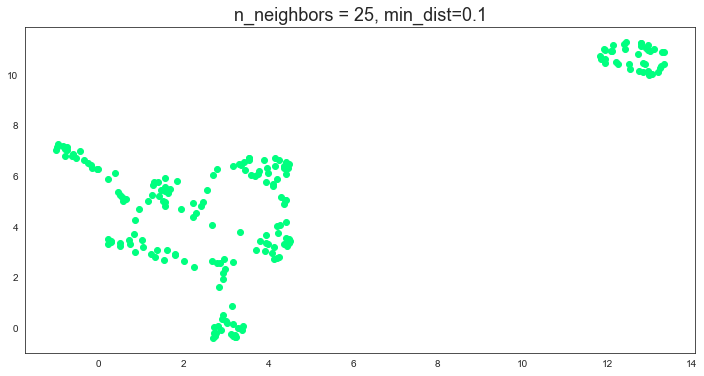

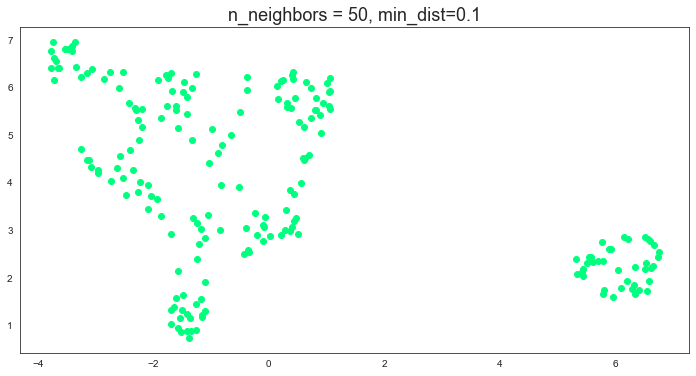

In [59]:
#finding ideal number of neighbors 
for n in (2, 5, 10, 15, 20, 25, 50):
    draw_umap(n_neighbors=n, title='n_neighbors = {}, min_dist=0.1'.format(n))

With values 2 and 5 for n_neighbors, the UMAP produces small and tight clustered chains and some are even in singles, which is evident in n_neighbors=2. As the value for n_neighbors increases, UMAP groups the samples into bigger and more distinct clusters, however, the clusters are no longer distinct passed n_neighbors=20. **Therefore, the ideal number of neighbors is either 10 or 15.**


**Next, determining, the min_dist parameter for neighbors 10 and 15. The parameter, min_dist, controls how tightly UMAP packs its points together.**

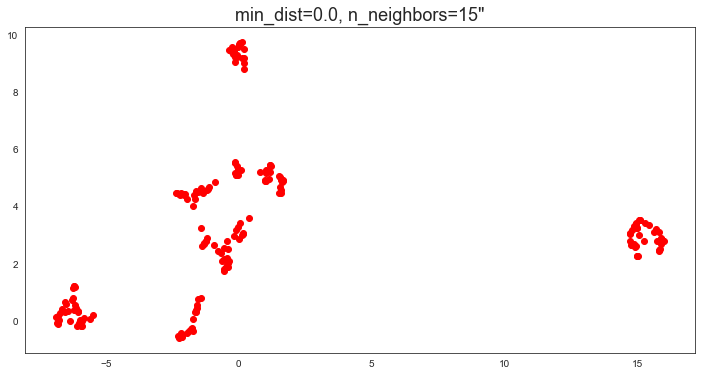

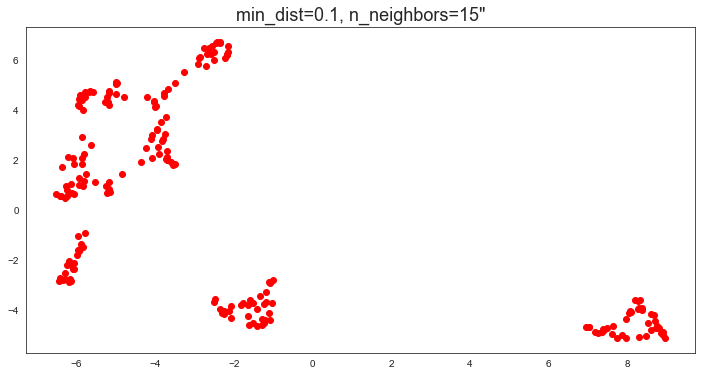

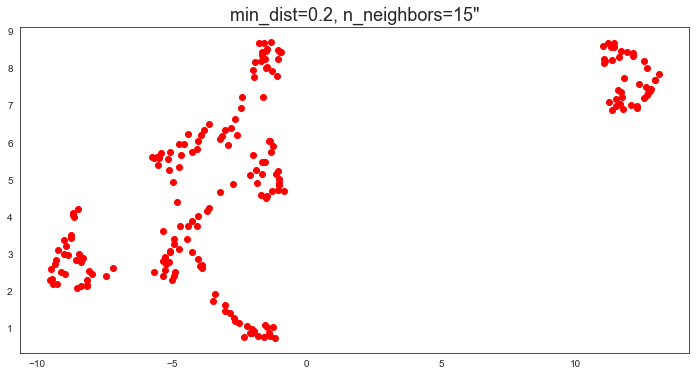

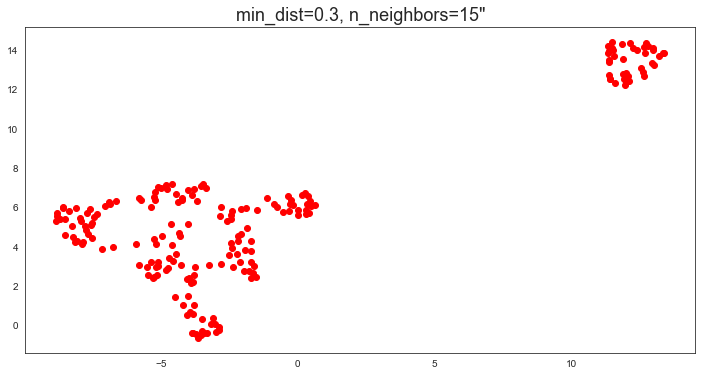

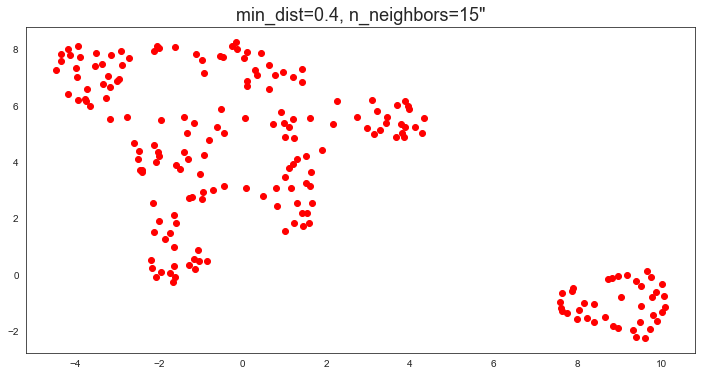

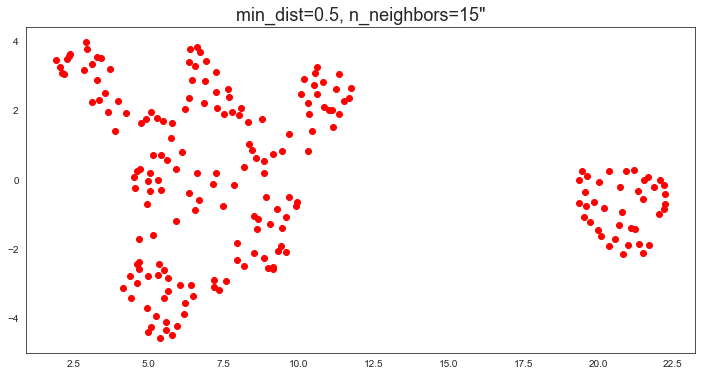

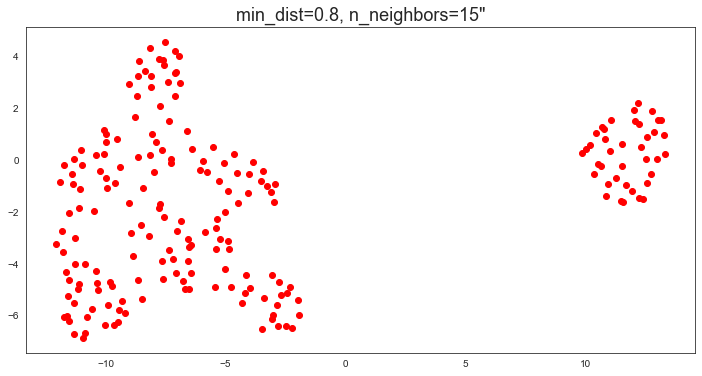

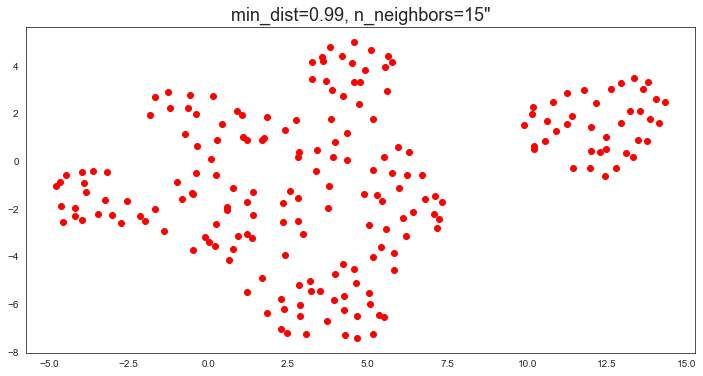

In [60]:
#default value for n_neighbors is 15, using n_neighbors=10
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(scaled_data);
    fig = plt.figure()
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c="red")
    plt.title(title, fontsize=18)
    

#determining ideal number of min_dist for 15 clusters 
for d in (0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.8, 0.99):
    draw_umap(min_dist=d, title='min_dist={}, n_neighbors=15"'.format(d))

**For 15 neighbors, the ideal value for min_dist is either 0 or 0.1 because the samples are tightly packed and the groups are distinct from each other. min_dist 0.3 and above are not ideal because they produced loose clusters**

**Chosen n_neighbors and min_dist:**
* min_dist 0 and min_dist 0.1

Silhouette score for KMeans n_clusters=2: 0.33547192894004574


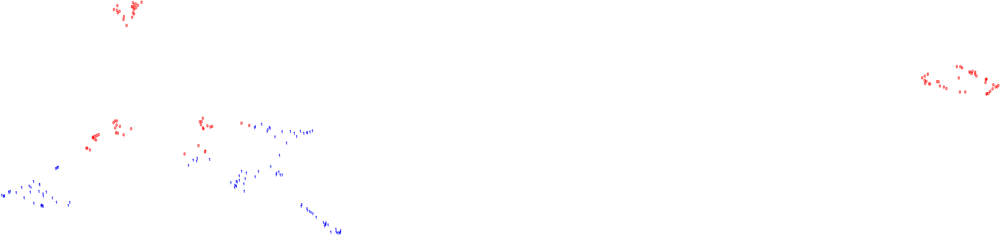

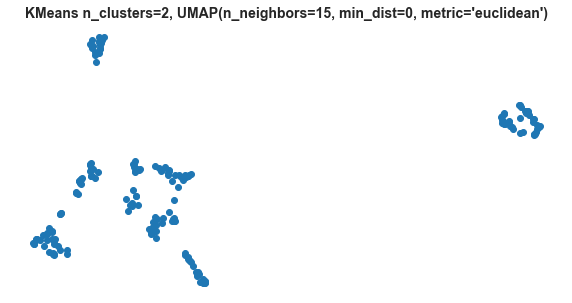

In [61]:
#applying kmeans clustering algorithm for 2 clusters
km=KMeans(n_clusters=2, random_state=24) 

#fitting model 
km=km.fit(data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)



#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=2: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'fontsize':50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=2, UMAP(n_neighbors=15, min_dist=0, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Silhouette score for KMeans n_clusters=3: 0.357793388710272


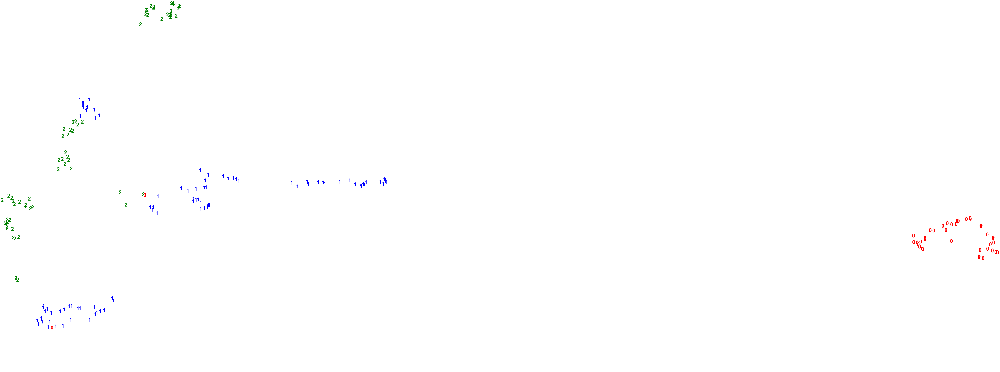

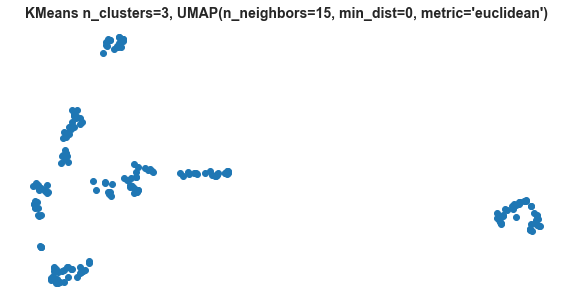

In [62]:
#applying kmeans clustering algorithm for 3 clusters
km=KMeans(n_clusters=3, random_state=24) 

#fitting model 
km=km.fit(data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)



#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=3: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'fontsize':50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=3, UMAP(n_neighbors=15, min_dist=0, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Silhouette score for KMeans n_clusters=4: 0.4039582785148566


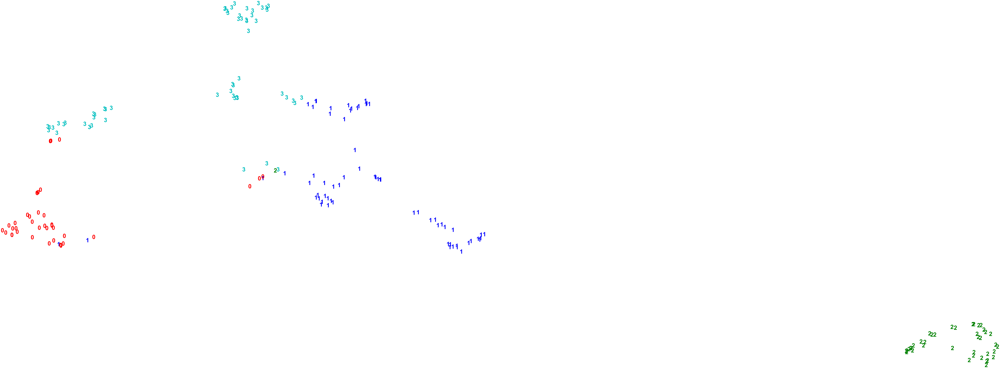

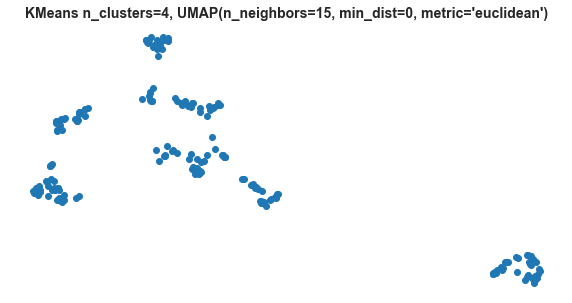

In [63]:
#applying kmeans clustering algorithm for 4 clusters
km=KMeans(n_clusters=4, random_state=24) 

#fitting model 
km=km.fit(data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)



#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=4: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'fontsize':50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=4, UMAP(n_neighbors=15, min_dist=0, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**Using min_dist=0 and n_neighbors=15, 4 clusters performed the best.**

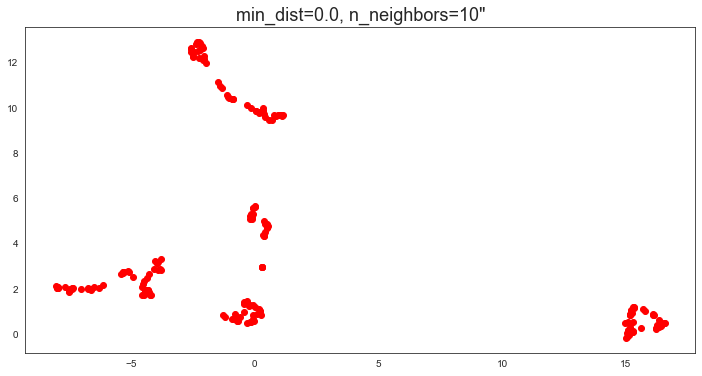

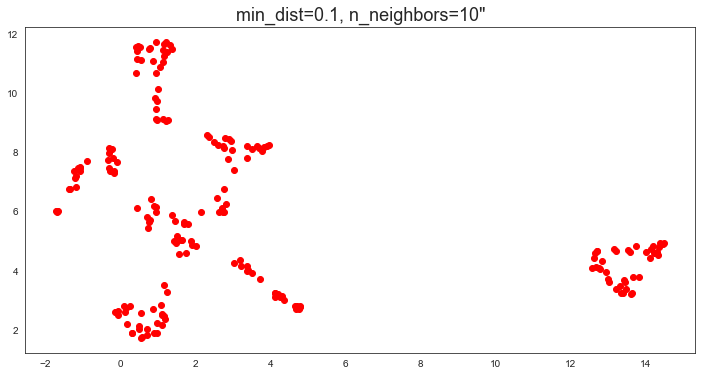

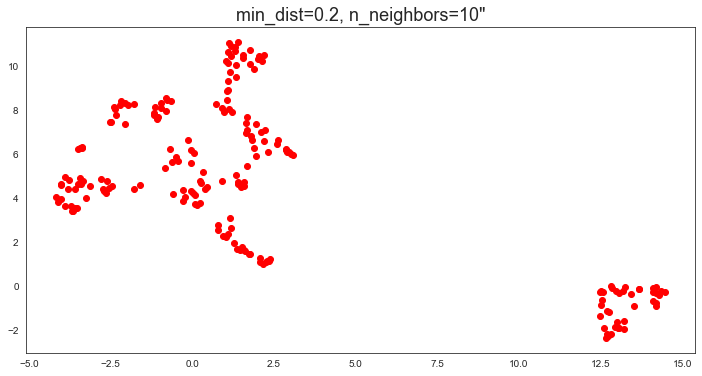

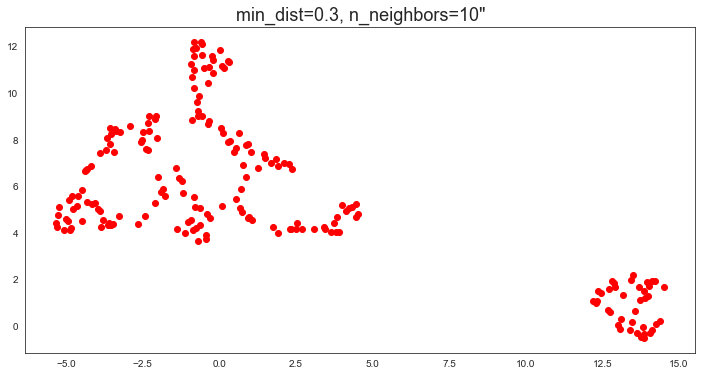

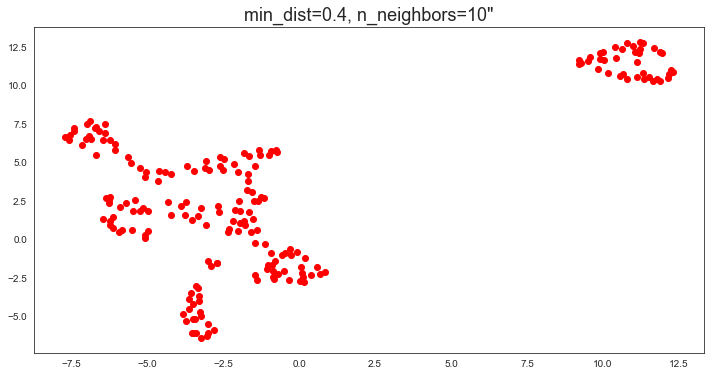

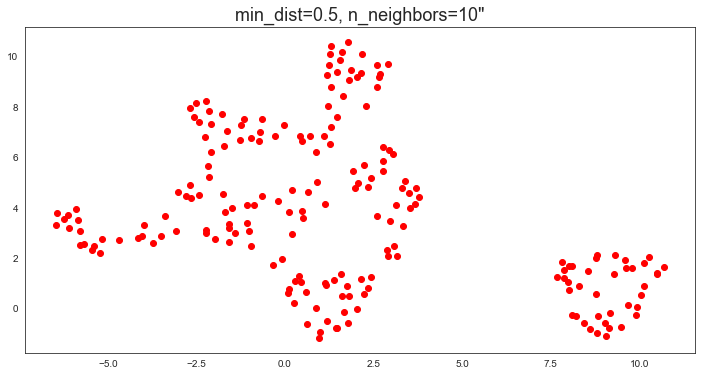

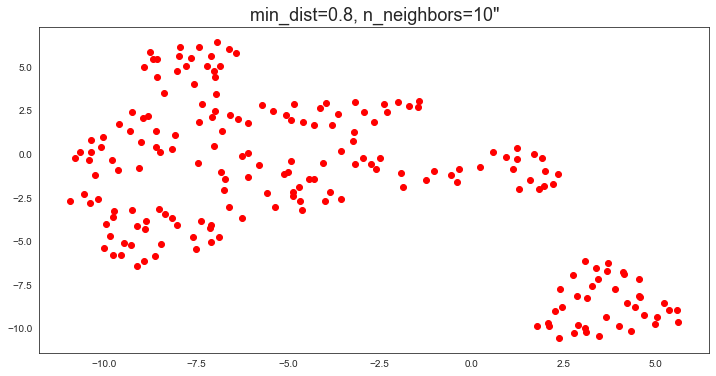

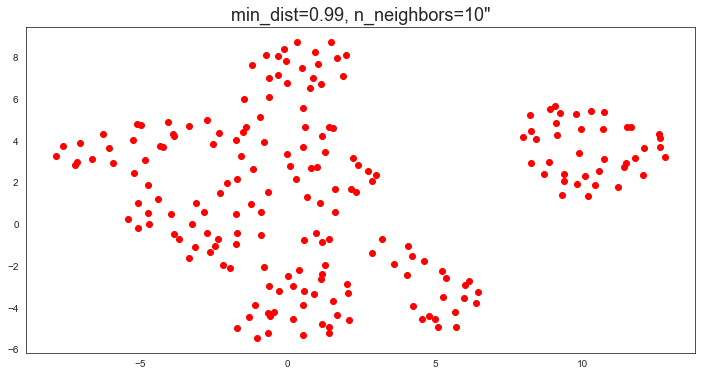

In [64]:
#checking ideal min_dist for 10 neighbors
def draw_umap(n_neighbors=10, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(scaled_data);
    fig = plt.figure()
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c="red")
    plt.title(title, fontsize=18)
    



#determining ideal number of min_dist for 20 neighbors
for d in (0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.8, 0.99):
    draw_umap(min_dist=d, title='min_dist={}, n_neighbors=10"'.format(d))

**Ideal min_dist values for 10 neighbors are 0, 0.1, and 0.2**

Shape of Dataset: (200, 3)
Silhouette score for KMeans n_clusters=3: 0.357793388710272


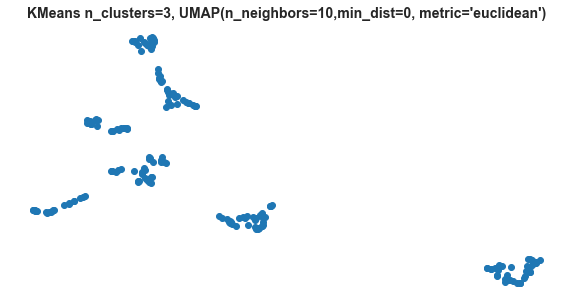

In [65]:
#applying kmeans clustering algorithm for 3 clusters
km=KMeans(n_clusters=3, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)
print(f"Shape of Dataset:", scaled_data.shape)


#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=3: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,8))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=3, UMAP(n_neighbors=10,min_dist=0, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Shape of Dataset: (200, 3)
Silhouette score for KMeans n_clusters=3: 0.357793388710272


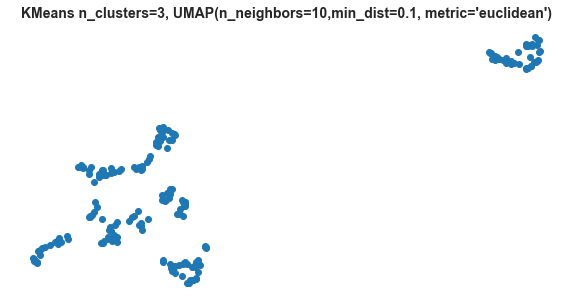

In [66]:
#applying kmeans clustering algorithm for 3 clusters
km=KMeans(n_clusters=3, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)
print(f"Shape of Dataset:", scaled_data.shape)


#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=3: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.1,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,8))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=3, UMAP(n_neighbors=10,min_dist=0.1, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Shape of Dataset: (200, 3)
Silhouette score for KMeans n_clusters=3: 0.357793388710272


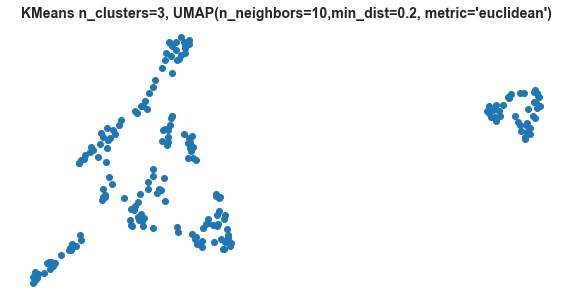

In [67]:
#applying kmeans clustering algorithm for 3 clusters
km=KMeans(n_clusters=3, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)
print(f"Shape of Dataset:", scaled_data.shape)


#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=3: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.2,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,8))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=3, UMAP(n_neighbors=10,min_dist=0.2, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Shape of Dataset: (200, 3)
Silhouette score for KMeans n_clusters=4: 0.4039582785148566


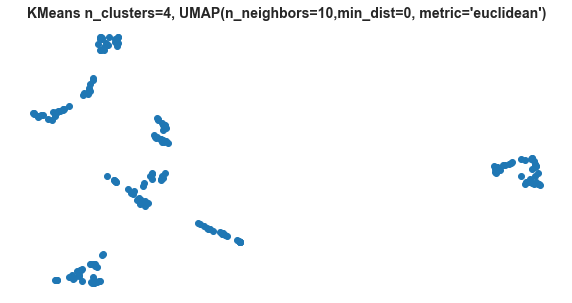

In [68]:
#applying kmeans clustering algorithm for 4 clusters
km=KMeans(n_clusters=4, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)
print(f"Shape of Dataset:", scaled_data.shape)


#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=4: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,8))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=4, UMAP(n_neighbors=10,min_dist=0, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Shape of Dataset: (200, 3)
Silhouette score for KMeans n_clusters=4: 0.4039582785148566


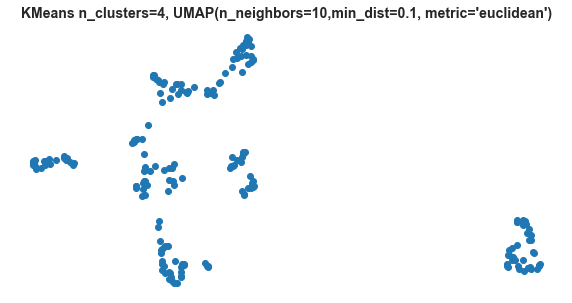

In [69]:
#applying kmeans clustering algorithm for 4 clusters
km=KMeans(n_clusters=4, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)
print(f"Shape of Dataset:", scaled_data.shape)


#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=4: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.1,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,8))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=4, UMAP(n_neighbors=10,min_dist=0.1, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Shape of Dataset: (200, 3)
Silhouette score for KMeans n_clusters=4: 0.4039582785148566


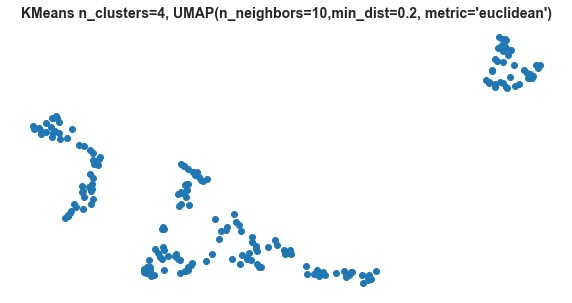

In [70]:
#applying kmeans clustering algorithm for 4 clusters
km=KMeans(n_clusters=4, random_state=24) 

#fitting model 
km=km.fit(scaled_data)

#getting predicted clusters
y_predicted=km.fit_predict(scaled_data)
print(f"Shape of Dataset:", scaled_data.shape)


#evaluation metric: silhouette_score
silhouette_kmeans=metrics.silhouette_score(scaled_data, y_predicted, metric="euclidean", random_state=24)
print(f"Silhouette score for KMeans n_clusters=4: {silhouette_kmeans}")


umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.2,
                      metric='euclidean').fit_transform(scaled_data)

plt.figure(figsize=(10,8))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_predicted[i],
             color=colours[int(y_predicted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.title("KMeans n_clusters=4, UMAP(n_neighbors=10,min_dist=0.2, metric='euclidean')", weight='heavy', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

<h1><font color='red'>KMeans Performance Evaluation</font></h1>

KMeans n_clusters=2 with 2 Principal Components and KMeans n_clusters=4 using UMAP(n_neighbors=10,min_dist=0.2, metric='euclidean') has the best overall performance for visual aid and silhouette score.

<h1><font color="teal">Gaussian Mixture Models</font></h1>

* soft clustering algorithm

In [71]:
from sklearn.mixture import GaussianMixture as GMM

In [72]:
#making empty list for storing silhouette scores and dataset used
gmm_silhouette=[]
gmm_pc2=[]

In [73]:
# Defining the agglomerative clustering
gmm_cluster = GMM(n_components=2, random_state=24)

# Fit model
clusters = gmm_cluster.fit_predict(pca2_df)


#evaluation metric: silhouette_score
silhouette_gmm_2_pc2=metrics.silhouette_score(pca2_df, clusters, metric="euclidean", random_state=24)
print(silhouette_gmm_2_pc2)


#appending silhouette score and dataset name
gmm_silhouette.append(silhouette_gmm_2_pc2)
gmm_pc2.append("2")

0.4172169120049922


2 PCA using GMM n_components=2


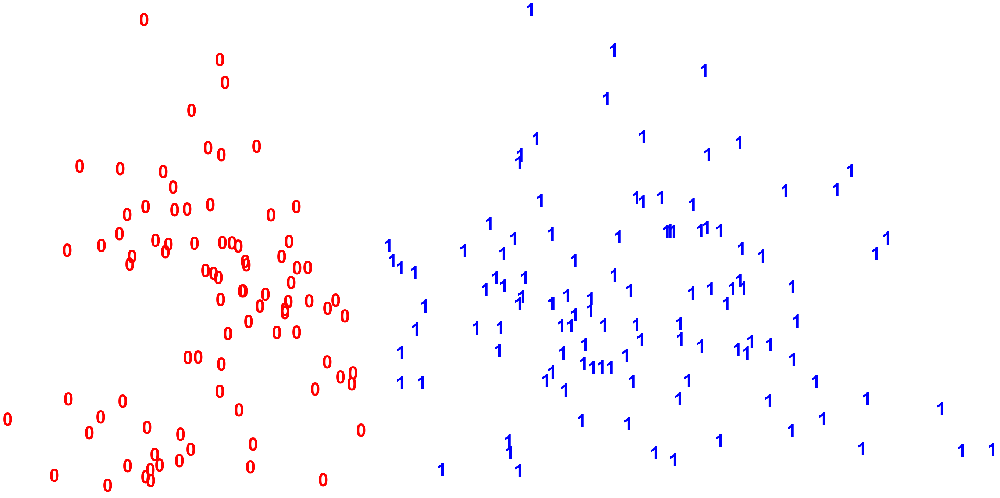

In [74]:
print("2 PCA using GMM n_components=2")
pca = PCA(n_components=2).fit_transform(pca2_df)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

UMAP (n_neighbors=10, min_dist=0.2, metric='euclidean') using GMM n_components=2


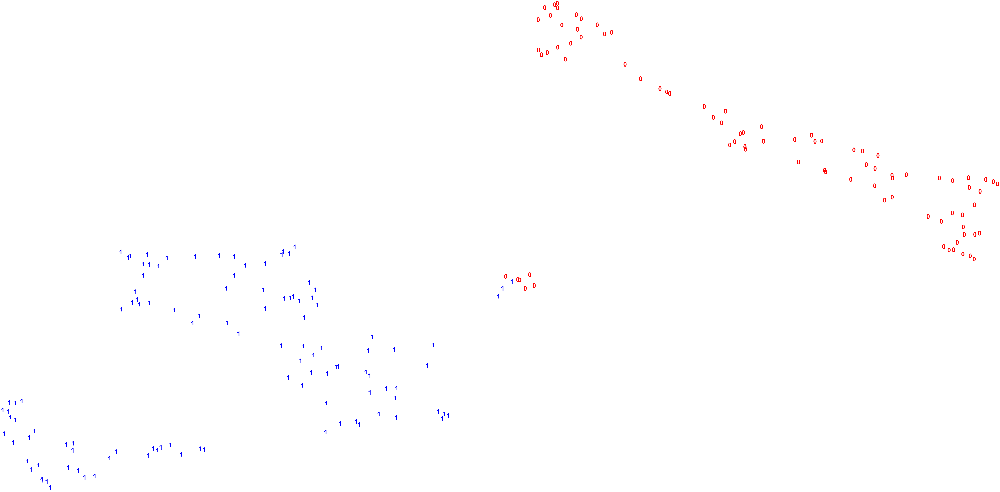

In [75]:
print("UMAP (n_neighbors=10, min_dist=0.2, metric='euclidean') using GMM n_components=2")

umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.2,
                      metric='euclidean').fit_transform(pca2_df)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], clusters[i],
             color=colours[int(clusters[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

UMAP (n_neighbors=15, min_dist=0.2, metric='euclidean') using GMM n_components=2


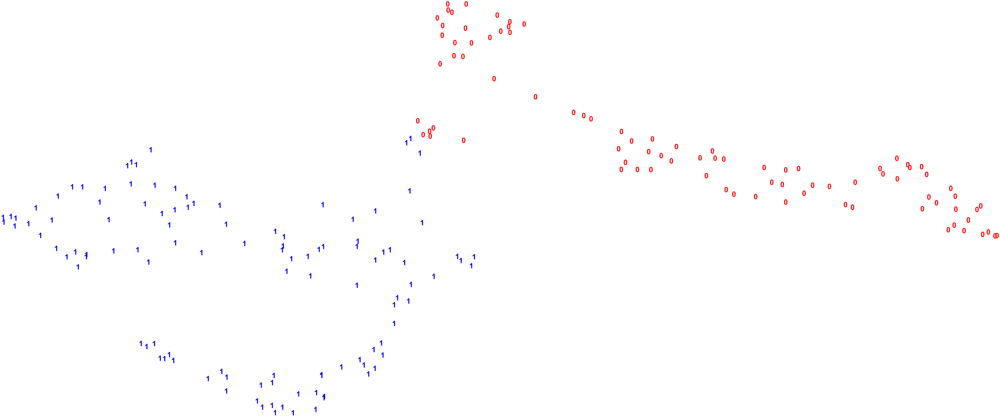

In [76]:
print("UMAP (n_neighbors=15, min_dist=0.2, metric='euclidean') using GMM n_components=2")

umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0.2,
                      metric='euclidean').fit_transform(pca2_df)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], clusters[i],
             color=colours[int(clusters[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**UMAP with n_neighbors=15, min_dist=0.2, metric='euclidean' shows more distinct clusters than with n_neighbors=10, min_dist=0.2.**

In [77]:
# Defining the agglomerative clustering
gmm_cluster = GMM(n_components=3, random_state=24)

# Fit model
clusters = gmm_cluster.fit_predict(pca2_df)


#evaluation metric: silhouette_score
silhouette_gmm_3_pc2=metrics.silhouette_score(pca2_df, clusters, metric="euclidean", random_state=24)
print(silhouette_gmm_3_pc2)


#appending silhouette score and dataset name
gmm_silhouette.append(silhouette_gmm_3_pc2)
gmm_pc2.append("3")

0.2887969421997842


2 PCA using GMM n_components=3


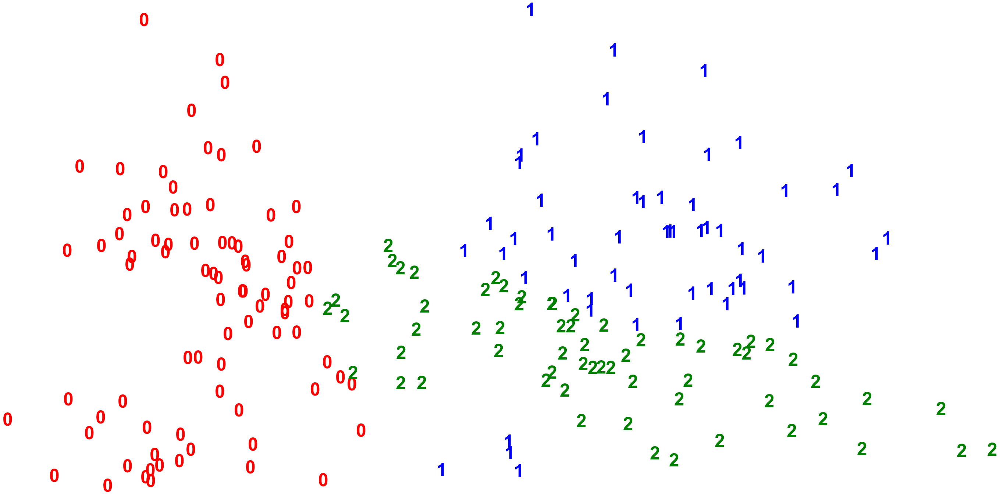

In [78]:
print("2 PCA using GMM n_components=3")
pca = PCA(n_components=2).fit_transform(pca2_df)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

UMAP using GMM n_components=3


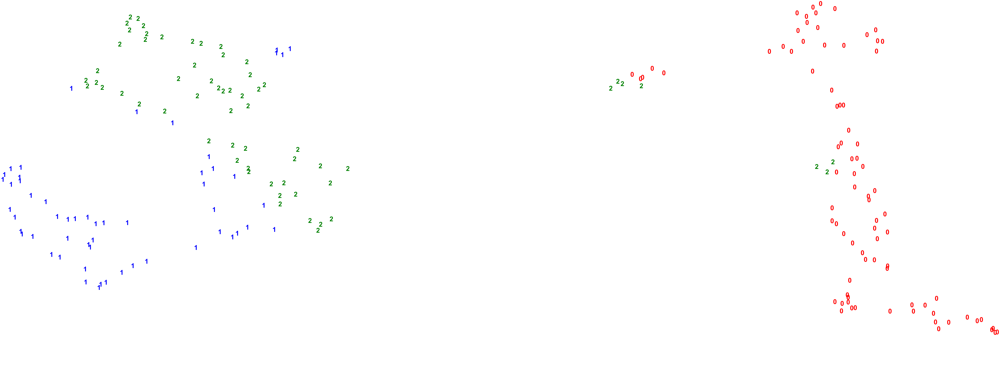

In [79]:
print("UMAP using GMM n_components=3")

umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.2,
                      metric='euclidean').fit_transform(pca2_df)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], clusters[i],
             color=colours[int(clusters[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [80]:
# Defining the agglomerative clustering
gmm_cluster =GMM(n_components=4, random_state=24)

# Fit model
clusters = gmm_cluster.fit_predict(pca2_df)


#evaluation metric: silhouette_score
silhouette_gmm_4_pc2=metrics.silhouette_score(pca2_df, clusters, metric="euclidean", random_state=24)
print(silhouette_gmm_4_pc2)


#appending silhouette score and dataset name
gmm_silhouette.append(silhouette_gmm_4_pc2)
gmm_pc2.append("4")

0.2509350332192475


2 PCA using GMM n_components=4


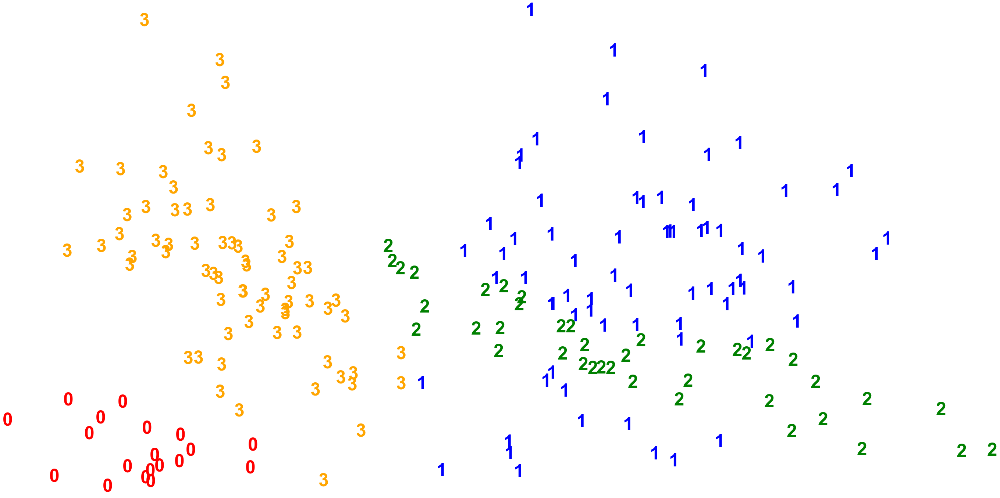

In [81]:
print("2 PCA using GMM n_components=4")
pca = PCA(n_components=2).fit_transform(pca2_df)

plt.figure(figsize=(10,5))
colours = ['red', 'blue', 'green', 'orange', 'black', 'teal']
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

UMAP using GMM n_components=4


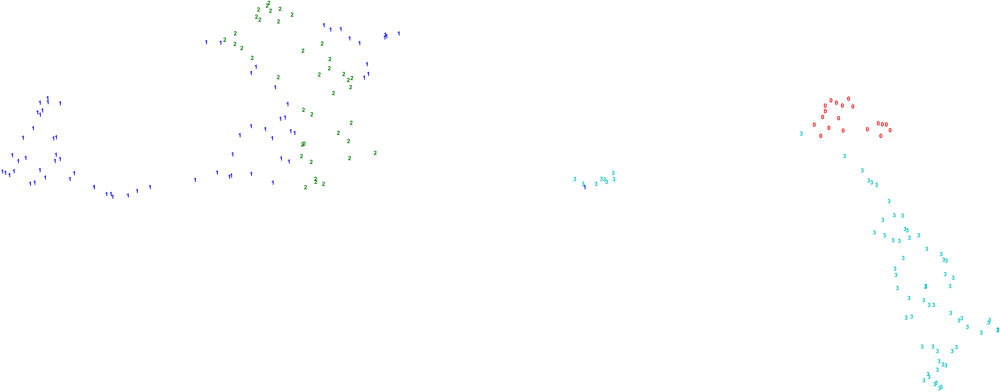

In [82]:
print("UMAP using GMM n_components=4")

umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.2,
                      metric='euclidean').fit_transform(pca2_df)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], clusters[i],
             color=colours[int(clusters[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [83]:
#for eligibility, rounding silhouette scores to 3 decimal places
gmm_sil_rounded = [round(x,3) for x in gmm_silhouette] 
gmm_sil_rounded 

[0.417, 0.289, 0.251]

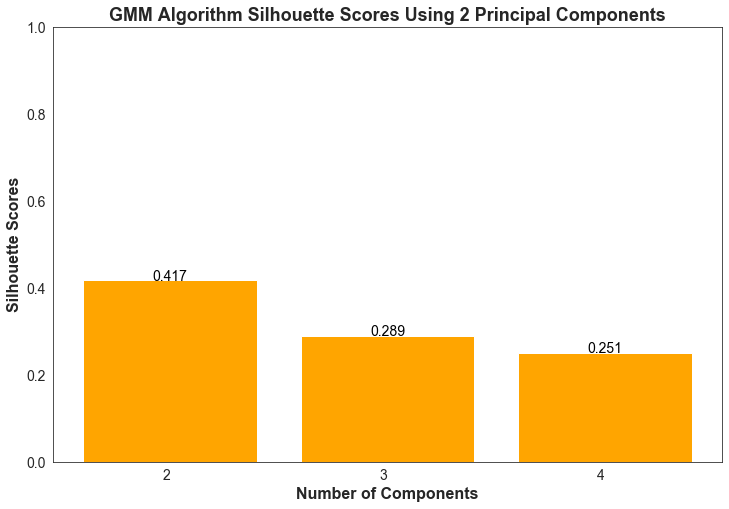

In [84]:
#using bar graph to display the silhouette scores for the number of clusters used in KMeans algorithm


plt.figure(figsize=(12,8))
sns.set_style("white")

no_components=gmm_pc2
sil_scores=gmm_sil_rounded

plt.bar(no_components,sil_scores, color='Orange')

#labeling each bar with their cv score value. 
for i in range(len(sil_scores)):
    plt.annotate(str(sil_scores[i]), xy=(no_components[i],sil_scores[i]), ha='center', 
                 fontsize=14,fontweight='normal', color='black') #va='bottom')
    

    

plt.title("GMM Algorithm Silhouette Scores Using 2 Principal Components", fontsize=18,weight='heavy')
plt.xlabel('Number of Components', fontsize=16, weight='heavy')
plt.ylabel('Silhouette Scores', fontsize=16, weight='heavy')

plt.xticks(rotation=0, horizontalalignment='right', 
           weight='normal', fontsize=14)
plt.yticks(weight='normal', fontsize=14)

plt.ylim(top=1) #setting y-axis limit value 


plt.show()

**Overall, the best performing argument for GMM is for 2 components and for visual aids using either the 2 principal components representation or UMAP with n_neighbors=15, min_dist=0.2, metric='euclidean' as arguments works well in distinguishing the clusters.**

# Comparison of K-means and GMM predictions

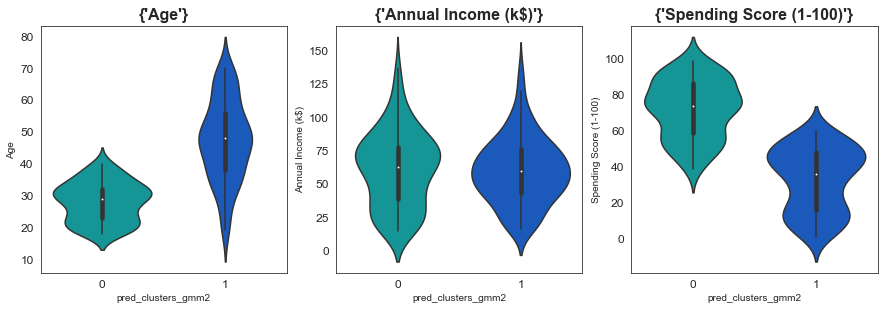

In [85]:
#integrating the predictions from GMM n_components=2 to original data


# Defining the agglomerative clustering
gmm_cluster = GMM(n_components=2, random_state=24)

# Fit model
gmm_pred = gmm_cluster.fit_predict(pca2_df)


#making violinplots
#adding predictive labels from kmeans ncluster=4 to the non-scaled_data
data['pred_clusters_gmm2']=gmm_pred

i=1
plt.figure(figsize=(15,10))
for col in data.columns[:3]:
    plt.subplot(2,3,i)
    plt.title({col}, fontsize=16, weight='heavy')
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    sns.violinplot(y=data[col], x=data['pred_clusters_gmm2'], palette='winter_r')
    i+=1
    
    
#plt.tight_layout()
plt.show()

In [86]:
#checking data columns
data.head()

,Age,Annual Income (k$),Spending Score (1-100),pred_clusters_km2,pred_clusters_km4,pred_clusters_gmm2
0,19,15,39,0,0,0
1,21,15,81,0,0,0
2,20,16,6,1,1,1
3,23,16,77,0,0,0
4,31,17,40,0,0,1


In [87]:
#scatter matrix 
import plotly.express as px
fig = px.scatter_matrix(data, 
                        dimensions=data.columns[:-3], color='pred_clusters_gmm2', title='Scatter Matrix of Features using GMM 2 components(silhouette score=0.42)', height=800)

fig

### GMM predictions looks very similar to K-means predictions, therefore, same observations apply.

**Spending score v Age**
* Cluster 1 (yellow) advanced aged customers show lower spending score than cluster 0(blue).
* Cluster 0 (blue) younger aged customer have a higher spending score than cluster 1(yellow).

**Annual Income v Age**
* Cluster 1 represent older aged group and their annual Income is higher than younger aged group represented by cluster 0.

**Annual Income v Spending Score**
* Cluster 1 has low spending score across all income 
* Cluster 0 has high spending score across all income 


**Cluster 1 is older aged group and collectively they have lower spending score and higher income compared to cluster 0 which are the younger aged group who has a higher spending score and lower income. Based on these results we now know that younger aged customers have a much higher spending activity than older aged customers so from this if the goal is to increase customers' spending score than it's best to target younger aged customers (>40 years old). To optimize marketing strategies, cater to younger aged customers, but if want to increase spending activity of older aged-customers than getting data on the products they buy most would be helpful to look into, for potentially improving this groups' spending scores.**

In [88]:
#scatter matrix 
import plotly.express as px
fig = px.scatter_matrix(data, 
                        dimensions=data.columns[:-3], color='pred_clusters_km2', title='Scatter Matrix of Features using K-means 2 clusters(silhouette score=0.43)', height=800)

fig

Value count for K-means:
1    103
0     97
Name: pred_clusters_km2, dtype: int64

Value count for GMM:
1    113
0     87
Name: pred_clusters_gmm2, dtype: int64


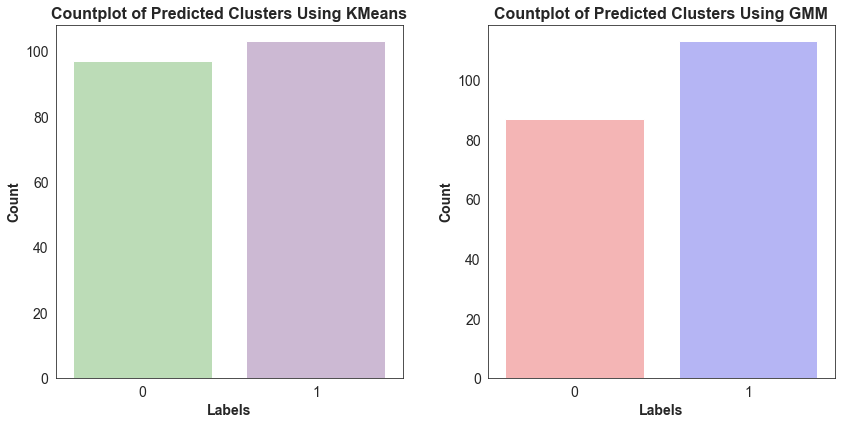

In [89]:
plt.subplot(1,2,1)
sns.countplot(data=data, x='pred_clusters_km2', palette='PRGn_r')
plt.title("Countplot of Predicted Clusters Using KMeans", fontsize=16, weight='heavy')
plt.ylabel("Count", fontsize=14, weight='heavy')
plt.xlabel("Labels", fontsize=14, weight='heavy')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.subplot(1,2,2)
sns.countplot(data=data, x='pred_clusters_gmm2', palette='bwr_r')
plt.title("Countplot of Predicted Clusters Using GMM", fontsize=16, weight='heavy')
plt.ylabel("Count", fontsize=14, weight='heavy')
plt.xlabel("Labels", fontsize=14, weight='heavy')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()


# getting value count of Kmeans predictions: 
count=data['pred_clusters_km2'].value_counts()
print(f'Value count for K-means:\n{count}')
print()
# getting value count of GMM predictions: 
count=data['pred_clusters_gmm2'].value_counts()
print(f'Value count for GMM:\n{count}')

**Though graphically, the clusters look very similar to each other, there are minor differences with the results that K-means and GMM algorithms produced. The predictive labels generated by K-means using 2 clusters is roughly close to each other with 103 and 97 for labels 0 and label 1 respectively, while the predictive labels for GMM using 2 components is 113 and 87.**